<div class="alert alert-block alert-success">
     
# IC PCDA CAPSTONE - HARRY BAKHSHI - NOTEBOOK 10 - FORECASTING WITH ML - VALIDATION SET PREDICTIONS
     
</div>

MIT License for code used from https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python in notebook:   
https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python?tab=MIT-1-ov-file     

(Accessed 06/06/2024)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import plotly.io as pio
import plotly.express as px
pio.templates.default = "plotly_white"
import pandas as pd
import pickle
import statistics
from darts.metrics import mase, mse, mae
from sklearn.preprocessing import StandardScaler
import time
import warnings
from src.utils.ts_utils import forecast_bias, darts_metrics_adapter
from src.utils.general import LogTime
from src.utils import plotting_utils
from src.forecasting.ml_forecasting import MissingValueConfig, FeatureConfig, ModelConfig, MLForecast, calculate_metrics

/Users/harrybakhshi/Desktop/Python_notes/Modern-Time-Series-Forecasting-with-Python-main/src/utils/data_utils.py:6: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


Load timeseries and seasonal period list:

In [2]:
#Import timeseries data and seasonal period list:
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/train_stationary_2.pik'
# with open(file, 'wb') as f:
#     pickle.dump(train, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     train = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/train_and_val_stationary_2.pik'
# with open(file, 'wb') as f:
#     pickle.dump(train_and_val, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     train_and_val = pickle.load(f) #load pickle file 'file' into variable
# file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/auto_stationary_transformer_pipeline_train_2.pik'
# # with open(file, 'wb') as f:
# #     pickle.dump(transformer_pipelines, f) #write df to .pik file on disk
# with open(file, 'rb') as f:
#      transformer_pipelines = pickle.load(f) #load pickle file 'file' into variable
# file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/train_feature_engineered_2.pik'
# with open(file, 'wb') as f:
#     pickle.dump(train, f) #write df to .pik file on disk
# # with open(file, 'rb') as f:
# #      train = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/val_feature_engineered_2.pik'
# with open(file, 'wb') as f:
#     pickle.dump(val, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     val = pickle.load(f) #load pickle file 'file' into variable
# file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/test_feature_engineered_2.pik'
# with open(file, 'wb') as f:
#     pickle.dump(test, f) #write df to .pik file on disk
# # with open(file, 'rb') as f:
# #      test = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/feature_engineering_added_temporal.pik'
# with open(file, 'wb') as f:
#        pickle.dump(added_temporal, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     added_temporal = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/feature_engineering_added_fourier.pik'
# with open(file, 'wb') as f:
#        pickle.dump(added_fourier, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     added_fourier = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/janatahack_demand_forecasting_data_variable_seasonal_period_list_2_2.pik'
# with open(file, 'wb') as f:
#     pickle.dump(seasonal_period_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     seasonal_period_list = pickle.load(f) #load pickle file 'file' into variable    

In [3]:
#For formatting plots:
def format_plot(fig, legends = None, xlabel="Time", ylabel="Value", title="", figsize=(500,900), font_size=15, title_font_size=20):
    if legends:
        names = cycle(legends)
        fig.for_each_trace(lambda t:  t.update(name = next(names)))
    fig.update_layout(
            autosize=False,
            width=figsize[1],
            height=figsize[0],
            title={
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
            titlefont={
                "size": 20
            },
            legend_title = None,
            legend=dict(
                font=dict(size=font_size),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                title_text=ylabel,
                titlefont=dict(size=font_size),
                tickfont=dict(size=font_size),
            ),
            xaxis=dict(
                title_text=xlabel,
                titlefont=dict(size=font_size),
                tickfont=dict(size=font_size),
            )
        )
    return fig

#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024

In [4]:
seasonal_period_list

[52,
 52,
 52,
 'not seasonal',
 'not seasonal',
 'not seasonal',
 'not seasonal',
 52,
 52,
 'not seasonal',
 52,
 'not seasonal',
 'not seasonal',
 52,
 'not seasonal',
 'not seasonal',
 'not seasonal',
 52,
 'not seasonal',
 'not seasonal',
 'not seasonal',
 'not seasonal',
 'not seasonal',
 'not seasonal',
 52,
 52,
 'not seasonal',
 52,
 4,
 'not seasonal',
 52,
 'not seasonal',
 52,
 8,
 52,
 52,
 'not seasonal',
 'not seasonal',
 'not seasonal',
 'not seasonal',
 52,
 52,
 'not seasonal',
 'not seasonal',
 52,
 'not seasonal',
 52,
 'not seasonal',
 52,
 52,
 8,
 'not seasonal',
 'not seasonal',
 'not seasonal',
 'not seasonal',
 'not seasonal',
 'not seasonal',
 'not seasonal',
 'not seasonal',
 'not seasonal',
 4,
 'not seasonal',
 'not seasonal',
 'not seasonal',
 52,
 'not seasonal',
 'not seasonal',
 9,
 'not seasonal',
 'not seasonal',
 'not seasonal',
 'not seasonal',
 8,
 4,
 'not seasonal',
 'not seasonal',
 'not seasonal',
 52,
 'not seasonal',
 52,
 'not seasonal',
 '

In [5]:
# train = auto_stat_train_target
train['timestamp'] = train.index
first_column = train.pop('timestamp') 
# insert column using insert(position,column_name, 
# first_column) function 
train.insert(0, 'timestamp', first_column)
#^https://www.geeksforgeeks.org/how-to-move-a-column-to-first-position-in-pandas-dataframe/
#Accessed 24/06/2024
test = val
test['timestamp'] = test.index
first_column = test.pop('timestamp') 
# insert column using insert(position,column_name, 
# first_column) function 
test.insert(0, 'timestamp', first_column)

# for col in range(len(list(test.columns.values[1:]))):
#     test.rename(columns={(list(test.columns.values[1:])[col]):(list(test.columns.values[1:])[col] + '_auto_stat')}, inplace=True)
# for col in range(len(list(auto_stat_train_target.columns.values))):
#     auto_stat_train_target.rename(columns={(list(auto_stat_train_target.columns.values)[col]):(list(auto_stat_train_target.columns.values)[col] + '_auto_stat')}, inplace=True)
# train = pd.concat([train, auto_stat_train_target], axis=1)
# print(list(auto_stat_train_target.columns.values))

/tmp/ipykernel_37225/1496988272.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train['timestamp'] = train.index
/tmp/ipykernel_37225/1496988272.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train.insert(0, 'timestamp', first_column)
/tmp/ipykernel_37225/1496988272.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use 

In [6]:
test

,timestamp,679023median_total_price,245338median_total_price,222087median_total_price,223153median_total_price,223245median_total_price,222765median_total_price,547934median_total_price,378934median_total_price,219029median_total_price,...,timestamp_Week_cos_1,timestamp_Week_cos_2,timestamp_Week_cos_3,timestamp_Week_cos_4,timestamp_Week_cos_5,timestamp_Week_cos_6,timestamp_Week_cos_7,timestamp_Week_cos_8,timestamp_Week_cos_9,timestamp_Week_cos_10
timestamp,,,,,,,,,,,,,,,,,,,,,
2013-03-18,2013-03-18,180.2625,334.198224,220.196145,180.605146,205.2,207.960095,178.887800,187.766988,325.464394,...,1.205367e-01,-0.970942,-3.546049e-01,0.885456,5.680647e-01,-0.748511,-7.485108e-01,0.568065,8.854560e-01,-0.354605
2013-03-25,2013-03-25,180.2625,327.759141,225.660685,180.726010,205.2,208.025039,180.444501,183.033554,331.503395,...,-1.608123e-16,-1.000000,-1.836970e-16,1.000000,-5.820167e-16,-1.000000,1.347730e-15,1.000000,5.510911e-16,-1.000000
2013-04-01,2013-04-01,180.2625,308.962582,229.253758,180.849104,205.2,208.089983,181.921273,178.307662,337.544521,...,-1.205367e-01,-0.970942,3.546049e-01,0.885456,-5.680647e-01,-0.748511,7.485108e-01,0.568065,-8.854560e-01,-0.354605
2013-04-08,2013-04-08,180.2625,314.031295,231.659888,186.911929,205.2,215.042427,171.719440,173.589310,343.587770,...,-2.393157e-01,-0.885456,6.631227e-01,0.568065,-9.350162e-01,-0.120537,9.927089e-01,-0.354605,-8.229839e-01,0.748511
2013-04-15,2013-04-15,180.2625,329.649230,231.387787,193.192917,205.2,220.622648,160.250179,174.816000,342.943561,...,-3.546049e-01,-0.748511,8.854560e-01,0.120537,-9.709418e-01,0.568065,5.680647e-01,-0.970942,1.205367e-01,0.885456
2013-04-22,2013-04-22,180.2625,335.889288,232.785594,193.490679,205.2,224.302870,171.699668,176.050232,342.301476,...,-4.647232e-01,-0.568065,9.927089e-01,-0.354605,-6.631227e-01,0.970942,-2.393157e-01,-0.748511,9.350162e-01,-0.120537
2013-04-29,2013-04-29,180.2625,340.473644,229.438527,195.334421,205.2,222.995591,177.567908,182.042005,341.661515,...,-5.680647e-01,-0.354605,9.709418e-01,-0.748511,-1.205367e-01,0.885456,-8.854560e-01,0.120537,7.485108e-01,-0.970942
2013-05-06,2013-05-06,180.2625,344.690278,226.195923,197.182677,205.2,221.688313,183.436147,188.041319,340.596635,...,-6.631227e-01,-0.120537,8.229839e-01,-0.970942,4.647232e-01,0.354605,-9.350162e-01,0.885456,-2.393157e-01,-0.568065
2013-05-13,2013-05-13,180.2625,348.904575,222.992698,194.449871,205.2,189.981034,183.645492,179.798174,339.533880,...,-7.485108e-01,0.120537,5.680647e-01,-0.970942,8.854560e-01,-0.354605,-3.546049e-01,0.885456,-9.709418e-01,0.568065


In [7]:
train.set_index(np.arange(0, len(train)), inplace=True)
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 114 entries, 0 to 113
Columns: 875 entries, timestamp to timestamp_Week_cos_10
dtypes: datetime64[ns](1), float32(728), float64(137), int32(9)
memory usage: 452.0 KB


In [8]:
col_list = list(train.columns.values[1:])
col_list

['679023median_total_price',
 '245338median_total_price',
 '222087median_total_price',
 '223153median_total_price',
 '223245median_total_price',
 '222765median_total_price',
 '547934median_total_price',
 '378934median_total_price',
 '219029median_total_price',
 '216418median_total_price',
 '219009median_total_price',
 '217390median_total_price',
 '216233median_total_price',
 '216425median_total_price',
 '320485median_total_price',
 '300021median_total_price',
 '245387median_total_price',
 '216419median_total_price',
 '398721median_total_price',
 '217217median_total_price',
 '217777median_total_price',
 '219844median_total_price',
 '600934median_total_price',
 '673209median_total_price',
 '327492median_total_price',
 '300291median_total_price',
 '546789median_total_price',
 '545621median_total_price',
 '679023median_base_price',
 '245338median_base_price',
 '222087median_base_price',
 '223153median_base_price',
 '223245median_base_price',
 '222765median_base_price',
 '547934median_base_

In [9]:
bool_list = []
cat_list = []
for feature in range(len(added_temporal)):
    found_output = added_temporal[feature].find('start')
    if found_output != -1:
        bool_list.append(added_temporal[feature])
    else:
        found_output = added_temporal[feature].find('end')
        if found_output != -1:
            bool_list.append(added_temporal[feature])
        else:
            cat_list.append(added_temporal[feature])

In [10]:
print(bool_list)
print(cat_list)

['timestamp_Is_quarter_end', 'timestamp_Is_quarter_start', 'timestamp_Is_year_end', 'timestamp_Is_year_start', 'timestamp_Is_month_start']
['timestamp_Month', 'timestamp_Quarter', 'timestamp_Week', 'timestamp_Elapsed']


In [11]:
def evaluate_model(model_config, feature_config, missing_config, train_features, train_target, test_features, test_target, train_target_original=None, target_transformer=None):
    ml_model = MLForecast(model_config=model_config, feature_config=feat_config, missing_config=missing_value_config, target_transformer=target_transformer)
    if target_transformer != None:
        ml_model.fit(train_features, train_target, is_transformed=True)
    else:
        ml_model.fit(train_features, train_target, is_transformed=False)
    y_pred = ml_model.predict(test_features)
    feat_df = ml_model.feature_importance()
    metrics = calculate_metrics(test_target, y_pred, model_config.name, train_target_original)
    return y_pred, metrics, feat_df

In [12]:
# !pip install --upgrade pip
# !pip install \
#    --no-binary lightgbm \
#    --config-settings=cmake.define.USE_OPENMP=OFF \
#    'lightgbm>=4.0.0'

In [13]:
#!pip install xgboost

In [14]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.svm import LinearSVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

In [15]:
col_list = list(train.columns.values[1:])
cont_list = []
for feature in range(len(col_list)):
    if col_list[feature] not in bool_list:
        cont_list.append(col_list[feature])
    if col_list[feature] not in cat_list:
        cont_list.append(col_list[feature])
for feature in range(len(col_list)):
    if col_list[feature] in bool_list:
        for item in cont_list[:]:
            if item == col_list[feature]:
                cont_list.remove(item)
    if col_list[feature] in cat_list:
        for item in cont_list[:]:
            if item == col_list[feature]:
                cont_list.remove(item)
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/cont_list_2.pik'
with open(file, 'wb') as f:
    pickle.dump(cont_list, f) #write df to .pik file on disk
# with open(file, 'rb') as f:
#      cont_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/col_list_2.pik'
with open(file, 'wb') as f:
    pickle.dump(col_list, f) #write df to .pik file on disk

In [16]:
cat = cat_list #+ cat_list_autostat
print(cat)
bool_ = bool_list #+ bool_list_autostat
print(bool_)
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/cat_list_2.pik'
with open(file, 'wb') as f:
    pickle.dump(cat, f) #write df to .pik file on disk
# with open(file, 'rb') as f:
#      cat = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/bool_list_2.pik'
with open(file, 'wb') as f:
    pickle.dump(bool_, f) #write df to .pik file on disk
# with open(file, 'rb') as f:
#      bool_ = pickle.load(f) #load pickle file 'file' into variable

['timestamp_Month', 'timestamp_Quarter', 'timestamp_Week', 'timestamp_Elapsed']
['timestamp_Is_quarter_end', 'timestamp_Is_quarter_start', 'timestamp_Is_year_end', 'timestamp_Is_year_start', 'timestamp_Is_month_start']


In [17]:
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/train_interim.pik'
with open(file, 'wb') as f:
    pickle.dump(train, f) #write df to .pik file on disk
# with open(file, 'rb') as f:
#      train = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/test_interim.pik'
with open(file, 'wb') as f:
    pickle.dump(test, f) #write df to .pik file on disk
# with open(file, 'rb') as f:
#      test = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/train_val_set.pik'
with open(file, 'wb') as f:
    pickle.dump(train, f) #write df to .pik file on disk
# with open(file, 'rb') as f:
#      train = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/test_val_set.pik'
with open(file, 'wb') as f:
    pickle.dump(test, f) #write df to .pik file on disk
# with open(file, 'rb') as f:
#      test = pickle.load(f) #load pickle file 'file' into variable

# HYPERPARAMETER TUNING FOR VALIDATION SET PREDICTIVE MODELS BY GridSearchCV

- initial max no. of iterations 1-20 (maximum number of iterations for model to run, in which convergence is aimed to be achieved (1) but may not be)  
^https://stackoverflow.com/questions/38900885/how-many-iterations-a-needed-to-train-tensorflow-with-the-entire-mnist-data-set     
Accessed 09/07/2024  
(1) - https://www.analyticsvidhya.com/blog/2016/01/ridge-lasso-regression-python-complete-tutorial/#How_Does_Lasso_Regression_Work?    
Accessed 17/07/2024

- initial max depth range 3-10 (tree depth for tree-based methods to control overfitting)   
^https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/   
Accessed 09/07/2024

- initial learning rate range 0.03-0.3 (avoid both passing beyond the minimum if gradient descent used and excessively long times for learning) (2)  
^https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/#:~:text=We%20will%20use%20an%20approach,should%20work%20for%20different%20problems.   
Accessed 09/07/2024   
(2) - https://developers.google.com/machine-learning/crash-course/reducing-loss/learning-rate   
Accessed 17/07/2024

- initial min samples split range 2 - 40 ("higher values prevent a model from learning relations which might be highly specific to the particular sample selected for a tree" but "too high values" can "lead to under-fitting")      
^https://towardsdatascience.com/how-to-tune-a-decision-tree-f03721801680   
Accessed 09/07/2024

- min_impurity_decrease range 0 - 1.0 (used in ML to control how deep trees grow based on impurity (how well any classes are separated from each other) (3))   
(3) - https://towardsdatascience.com/how-to-tune-a-decision-tree-f03721801680   
Accessed 17/07/2024

1. Narrow down with each search but containing last hyperparameter found in search window - if can't narrow more keep same (repeat)
2. 1st repeat of hyperparameter - fix it     
3. Fix repeated hyperparameters in searches and continue narrowing down with each search for others   
4. Choose other hyperparameter values as 1st repeated in searches, fixing when 1st repeated in searches    
5. Stop when all fixed - have set to choose best from each with a score

In [47]:
from sklearn.model_selection import GridSearchCV

hyp_dicts_list_var_1 = []

In [48]:
hyp_dict_var_1_lasso = {}


#LassoCV needs data to be standardised (usually by observed variance) beforehand
#Standardisation by z-score (z-score normalisation) is standardisation by [the square 
#root of] the observed variance (1)
#^https://www.universiteitleiden.nl/binaries/content/assets/science/mi/scripties/statscience/2019-2020/final-version_thesis_amy-vervoorn.pdf
#Accessed 11/07/2024
#(1) - https://inomics.com/blog/standardizing-the-data-of-different-scales-which-method-to-use-1036202#:~:text=Standardization%3A%20calculating%20Z%2Dscore,value%20from%20its%20average%20value).
#Accessed 12/07/2024

from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
sc_y = StandardScaler()

var = 0
cont_list_intern = []
cont_list_intern = cont_list[:]
for item in cont_list_intern[:]:
    if item == col_list[var]:
        cont_list_intern.remove(item)
feat_config = FeatureConfig(
    date="timestamp",
    target=col_list[var],
    original_target=col_list[var],
    continuous_features=cont_list_intern,
    categorical_features=cat,
    boolean_features=bool_,
    index_cols=["timestamp"],
    exogenous_features=[],
)

X_train, y_train, y_train_orig = feat_config.get_X_y(df=train, categorical=False, exogenous=False)

index_x = X_train.index
index_y = y_train.index
X_train = pd.DataFrame(sc_X.fit_transform(X_train), index=index_x, columns=sc_X.get_feature_names_out())
y_train = pd.DataFrame(sc_y.fit_transform(y_train), index=index_y, columns=sc_y.get_feature_names_out())

y_train = y_train.squeeze()

In [49]:
max_iter_list = np.arange(2, 22, 2)
param_grid = {
 'max_iter': max_iter_list,
}

gridSearch = GridSearchCV(LassoCV(tol=0.175), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_lasso[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_lasso)

#max iter = 4

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

Start!
secs:  211.26399397850037
min:  3.5210665663083396
score:  0.14029669069415912
parameters:  {'max_iter': 4}
LassoCV(max_iter=4, tol=0.175)
{0.14029669069415912: {'max_iter': 4}}


In [50]:
max_iter_list = np.arange(2, 12, 2)
param_grid = {
 'max_iter': max_iter_list,
}

gridSearch = GridSearchCV(LassoCV(tol=0.175), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_lasso[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_lasso)

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

#max iter = 6


Start!
secs:  109.3050708770752
min:  1.8217511812845866
score:  0.14029669069415912
parameters:  {'max_iter': 4}
LassoCV(max_iter=4, tol=0.175)
{0.14029669069415912: {'max_iter': 4}}


In [51]:
#LassoCV: best max_iter = 4
hyp_dicts_list_var_1.append(hyp_dict_var_1_lasso)

In [52]:
hyp_dict_var_1_linearSVR = {}

#Normally common class types contain the feature scaling function so that they make feature 
#scaling automatically. Without manual step of z-score standardisation  using linearSVR and 
#the data the objective does not converge so perform feature scaling using Python:
#^https://www.analyticsvidhya.com/blog/2020/03/support-vector-regression-tutorial-for-machine-learning/
#Accessed 09/07/2024
    
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
sc_y = StandardScaler()

var = 0
cont_list_intern = []
cont_list_intern = cont_list[:]
for item in cont_list_intern[:]:
    if item == col_list[var]:
        cont_list_intern.remove(item)
feat_config = FeatureConfig(
    date="timestamp",
    target=col_list[var],
    original_target=col_list[var],
    continuous_features=cont_list_intern,
    categorical_features=cat,
    boolean_features=bool_,
    index_cols=["timestamp"],
    exogenous_features=[],
)

X_train, y_train, y_train_orig = feat_config.get_X_y(df=train, categorical=False, exogenous=False)

index_x = X_train.index
index_y = y_train.index
X_train = pd.DataFrame(sc_X.fit_transform(X_train), index=index_x, columns=sc_X.get_feature_names_out())
y_train = pd.DataFrame(sc_y.fit_transform(y_train), index=index_y, columns=sc_y.get_feature_names_out())

y_train = y_train.squeeze()

In [53]:
max_iter_list = np.arange(2, 22, 2)
param_grid = {
 'max_iter': max_iter_list,
}

gridSearch = GridSearchCV(LinearSVR(tol=0.175), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024
#^https://stackoverflow.com/questions/52670012/convergencewarning-liblinear-failed-to-converge-increase-the-number-of-iterati
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_linearSVR[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_linearSVR)

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

#max_iter = 18

Start!


/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the n

secs:  0.992779016494751
min:  0.016546316941579185
score:  0.6774337264456889
parameters:  {'max_iter': 18}
LinearSVR(max_iter=18, tol=0.175)
{0.6774337264456889: {'max_iter': 18}}


In [151]:
max_iter_list = np.arange(2, 20, 2)
param_grid = {
 'max_iter': max_iter_list,
}

gridSearch = GridSearchCV(LinearSVR(tol=0.175), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_linearSVR[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_linearSVR)

#max_iter = 16

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024


Start!


/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/opt/anaconda3/lib/python3.11/site-packages/sklearn/

secs:  1.1050560474395752
min:  0.018417600790659586
score:  0.616291496969419
parameters:  {'max_iter': 16}
LinearSVR(max_iter=16, tol=0.175)
{0.6308594163076957: {'max_iter': 20}, 0.616291496969419: {'max_iter': 16}}


In [54]:
max_iter_list = np.arange(2, 18, 2)
param_grid = {
 'max_iter': max_iter_list,
}

gridSearch = GridSearchCV(LinearSVR(tol=0.175), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_linearSVR[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_linearSVR)

#max_iter = 14

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024


Start!


/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the n

secs:  0.7537479400634766
min:  0.01256246566772461
score:  0.6701223600001105
parameters:  {'max_iter': 14}
LinearSVR(max_iter=14, tol=0.175)
{0.6774337264456889: {'max_iter': 18}, 0.6701223600001105: {'max_iter': 14}}


In [55]:
max_iter_list = np.arange(2, 16, 2)
param_grid = {
 'max_iter': max_iter_list,
}

gridSearch = GridSearchCV(LinearSVR(tol=0.175), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_linearSVR[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_linearSVR)

#max_iter = 14

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024


Start!


/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the n

secs:  0.7382862567901611
min:  0.012304770946502685
score:  0.662697614981417
parameters:  {'max_iter': 14}
LinearSVR(max_iter=14, tol=0.175)
{0.6774337264456889: {'max_iter': 18}, 0.6701223600001105: {'max_iter': 14}, 0.662697614981417: {'max_iter': 14}}


In [56]:
#LinearSVR best max_iter=18
hyp_dicts_list_var_1.append(hyp_dict_var_1_linearSVR)

In [57]:
hyp_dict_var_1_XGB = {}

var = 0
cont_list_intern = []
cont_list_intern = cont_list[:]
for item in cont_list_intern[:]:
    if item == col_list[var]:
        cont_list_intern.remove(item)
feat_config = FeatureConfig(
    date="timestamp",
    target=col_list[var],
    original_target=col_list[var],
    continuous_features=cont_list_intern,
    categorical_features=cat,
    boolean_features=bool_,
    index_cols=["timestamp"],
    exogenous_features=[],
)

X_train, y_train, y_train_orig = feat_config.get_X_y(df=train, categorical=False, exogenous=False)

y_train = y_train.squeeze()

In [58]:
max_depth_list = np.arange(1, 11, 1)
learning_rate_list = np.arange(0.03, 0.33, 0.03)
param_grid = {
 'max_depth': max_depth_list,
 'learning_rate': learning_rate_list,
}

gridSearch = GridSearchCV(XGBRegressor(random_state=22), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_XGB[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_XGB)

#'learning_rate': 0.18, 'max_depth': 3}

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

Start!
secs:  141.36012172698975
min:  2.3560020287831622
score:  0.9719472468335036
parameters:  {'learning_rate': 0.18, 'max_depth': 3}
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.18, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=22, ...)
{0.9719472468335036: {'learning_rate': 0.18, 'max_depth': 3}}


In [59]:
max_depth_list = np.arange(1, 5, 1)
learning_rate_list = np.arange(0.1, 0.33, 0.01)
param_grid = {
 'max_depth': max_depth_list,
 'learning_rate': learning_rate_list,
}

gridSearch = GridSearchCV(XGBRegressor(random_state=22), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_XGB[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_XGB)

#'learning_rate': 0.15999999999999998, 'max_depth': 3

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

Start!
secs:  120.060231924057
min:  2.0010038654009503
score:  0.9720399817455029
parameters:  {'learning_rate': 0.15999999999999998, 'max_depth': 3}
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.15999999999999998,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=22, ...)
{0.9719472468335036: {'learning_rate': 0.18, 'max_depth': 3}, 0.9720399817455029: {'learning

In [60]:
max_depth_list = [3]
learning_rate_list = np.arange(0.12, 0.33, 0.01)
param_grid = {
 'max_depth': max_depth_list,
 'learning_rate': learning_rate_list,
}

gridSearch = GridSearchCV(XGBRegressor(random_state=22), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_XGB[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_XGB)

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

Start!
secs:  27.728127241134644
min:  0.4621354540189107
score:  0.9720399817455029
parameters:  {'learning_rate': 0.16000000000000003, 'max_depth': 3}
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.16000000000000003,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=22, ...)
{0.9719472468335036: {'learning_rate': 0.18, 'max_depth': 3}, 0.9720399817455029: {'learni

In [61]:
max_depth_list = [3]
learning_rate_list = np.arange(0.14, 0.33, 0.01)
param_grid = {
 'max_depth': max_depth_list,
 'learning_rate': learning_rate_list,
}

gridSearch = GridSearchCV(XGBRegressor(random_state=22), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_XGB[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_XGB)

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

Start!
secs:  23.311502933502197
min:  0.3885250488917033
score:  0.9720399817455029
parameters:  {'learning_rate': 0.16000000000000003, 'max_depth': 3}
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.16000000000000003,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=22, ...)
{0.9719472468335036: {'learning_rate': 0.18, 'max_depth': 3}, 0.9720399817455029: {'learni

In [62]:
#XGB best 'learning_rate': 0.16000000000000003, 'max_depth': 3
hyp_dicts_list_var_1.append(hyp_dict_var_1_XGB)

In [63]:
hyp_dict_var_1_LGBM = {}

max_depth_list = np.arange(1, 11, 1)
learning_rate_list = np.arange(0.03, 0.33, 0.03)
param_grid = {
 'max_depth': max_depth_list,
 'learning_rate': learning_rate_list,
}

gridSearch = GridSearchCV(LGBMRegressor(random_state=22), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_LGBM[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_LGBM)

#'learning_rate': 0.12, 'max_depth': 2

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

Start!
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000070 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3063
[LightGBM] [Info] Number of data points in the train set: 91, number of used features: 168
[LightGBM] [Info] Start training from score 187.614560
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

In [64]:
max_depth_list = np.arange(1, 9, 1)
learning_rate_list = np.arange(0.03, 0.30, 0.03)
param_grid = {
 'max_depth': max_depth_list,
 'learning_rate': learning_rate_list,
}

gridSearch = GridSearchCV(LGBMRegressor(random_state=22), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_LGBM[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_LGBM)

#'learning_rate': 0.12, 'max_depth': 2

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

Start!
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000070 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3063
[LightGBM] [Info] Number of data points in the train set: 91, number of used features: 168
[LightGBM] [Info] Start training from score 187.614560
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

In [65]:
#LightGBM best 'learning_rate': 0.12, 'max_depth': 2
hyp_dicts_list_var_1.append(hyp_dict_var_1_LGBM)

In [66]:
hyp_dict_var_1_dtree = {}

max_depth_list = np.arange(1, 11, 1)
min_samples_split_list = np.arange(2, 46, 4)
min_impurity_decrease_list = np.arange(0, 1.1, 0.1)
param_grid = {
 'max_depth': max_depth_list,
 'min_samples_split': min_samples_split_list,
 'min_impurity_decrease': min_impurity_decrease_list,
}

gridSearch = GridSearchCV(DecisionTreeRegressor(random_state=22), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_dtree[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_dtree)

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

#'max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 2

Start!
secs:  73.68713903427124
min:  1.2281189839045206
score:  0.9982502139310021
parameters:  {'max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 2}
DecisionTreeRegressor(max_depth=3, random_state=22)
{0.9982502139310021: {'max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 2}}


In [67]:
max_depth_list = np.arange(1, 9, 1)
min_samples_split_list = np.arange(2, 22, 2)
min_impurity_decrease_list = np.arange(0, 0.5, 0.1)
param_grid = {
 'max_depth': max_depth_list,
 'min_samples_split': min_samples_split_list,
 'min_impurity_decrease': min_impurity_decrease_list,
}

gridSearch = GridSearchCV(DecisionTreeRegressor(random_state=22), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_dtree[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_dtree)

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

#'max_depth': 5, 'min_impurity_decrease': 0.0, 'min_samples_split': 4

Start!
secs:  24.39889693260193
min:  0.40664828221003213
score:  0.9982502139310021
parameters:  {'max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 2}
DecisionTreeRegressor(max_depth=3, random_state=22)
{0.9982502139310021: {'max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 2}}


In [68]:
#Decision Tree best max_depth = 3, min_impurity_decrease = 0.0, min_samples_split = 2
hyp_dicts_list_var_1.append(hyp_dict_var_1_dtree)

In [69]:
hyp_dict_var_1_rfor = {}

max_depth_list = np.arange(1, 11, 1)
min_samples_split_list = np.arange(2, 46, 4)
min_impurity_decrease_list = np.arange(0, 1.1, 0.1)
param_grid = {
 'max_depth': max_depth_list,
 'min_samples_split': min_samples_split_list,
 'min_impurity_decrease': min_impurity_decrease_list,
}

gridSearch = GridSearchCV(RandomForestRegressor(random_state=22), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_rfor[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_rfor)

#'max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 6}

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

Start!
secs:  737.4139850139618
min:  12.29023308356603
score:  0.9951648923286969
parameters:  {'max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 6}
RandomForestRegressor(max_depth=3, min_samples_split=6, random_state=22)
{0.9951648923286969: {'max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 6}}


In [70]:
max_depth_list = np.arange(1, 9, 1)
min_samples_split_list = np.arange(2, 22, 2)
min_impurity_decrease_list = np.arange(0, 0.5, 0.1)
param_grid = {
 'max_depth': max_depth_list,
 'min_samples_split': min_samples_split_list,
 'min_impurity_decrease': min_impurity_decrease_list,
}

gridSearch = GridSearchCV(RandomForestRegressor(random_state=22), param_grid, cv=5, n_jobs=1)
#^https://stackoverflow.com/questions/20681864/lasso-on-sklearn-does-not-converge
#Accessed 09/07/2024

start1 = time.time() 
print('Start!')
gridSearch.fit(X_train, y_train)
end1 = time.time()
print('secs: ', (end1 - start1)) # time in seconds
print('min: ', (end1 - start1)/60) # time in min
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)
print(gridSearch.best_estimator_)

hyp_dict_var_1_rfor[gridSearch.best_score_] = gridSearch.best_params_
print(hyp_dict_var_1_rfor)

#'max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 6

#^https://vzhang1999.medium.com/classification-tree-growing-and-pruning-with-python-code-grid-search-cost-complexity-function-b2e45e33a1a4
#Accessed 09/07/2024

Start!
secs:  257.79654693603516
min:  4.296609115600586
score:  0.9951648923286969
parameters:  {'max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 6}
RandomForestRegressor(max_depth=3, min_samples_split=6, random_state=22)
{0.9951648923286969: {'max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 6}}


In [3]:
hyp_dicts_list_var_1

[{0.14029669069415912: {'max_iter': 4}},
 {0.6774337264456889: {'max_iter': 18},
  0.6701223600001105: {'max_iter': 14},
  0.662697614981417: {'max_iter': 14}},
 {0.9719472468335036: {'learning_rate': 0.18, 'max_depth': 3},
  0.9720399817455029: {'learning_rate': 0.16000000000000003, 'max_depth': 3}},
 {0.9795015662214908: {'learning_rate': 0.12, 'max_depth': 2}},
 {0.9982502139310021: {'max_depth': 3,
   'min_impurity_decrease': 0.0,
   'min_samples_split': 2}},
 {0.9951648923286969: {'max_depth': 3,
   'min_impurity_decrease': 0.0,
   'min_samples_split': 6}}]

In [71]:
# #RandomForest best params = max_depth': 3, 'min_impurity_decrease': 0.0, 'min_samples_split': 6
hyp_dicts_list_var_1.append(hyp_dict_var_1_rfor)

In [2]:
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/hyp_dicts_list_var_1_3.pik'
# with open(file, 'wb') as f:
#     pickle.dump(hyp_dicts_list_var_1, f) #write df to .pik file on disk
with open(file, 'rb') as f:
      hyp_dicts_list_var_1 = pickle.load(f) #load pickle file 'file' into variable

In [21]:
# file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/hyp_dicts_list_var_1.pik'
# # with open(file, 'wb') as f:
# #     pickle.dump(hyp_dicts_list_var_1, f) #write df to .pik file on disk
# with open(file, 'rb') as f:
#       hyp_dicts_list_var_1 = pickle.load(f) #load pickle file 'file' into variable

In [3]:
def get_hyperparamter_lists(hyp_dicts_list):
    lasso_max_iter_list = []
    linearSVR_max_iter_list = []
    XGB_learning_rate_list = []
    XGB_max_depth_list = []
    LGBM_learning_rate_list = []
    LGBM_max_depth_list = []
    dtree_max_depth_list = []
    dtree_min_impurity_decrease_list = []
    dtree_min_samples_split_list = []
    rfor_max_depth_list = []
    rfor_min_impurity_decrease_list = []
    rfor_min_samples_split_list = []
    for i in range(len(hyp_dicts_list)):
        if i == 0:
            for ele in range(len(list(hyp_dicts_list_var_1[i].values()))):
                lasso_max_iter_list.append(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[0])
        if i == 1:
            for ele in range(len(list(hyp_dicts_list_var_1[i].values()))):
                linearSVR_max_iter_list.append(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[0])
        if i == 2:
            for ele in range(len(list(hyp_dicts_list_var_1[i].values()))):
                XGB_learning_rate_list.append(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[0])
                XGB_max_depth_list.append(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[1])
        if i == 3:
            for ele in range(len(list(hyp_dicts_list_var_1[i].values()))):
                LGBM_learning_rate_list.append(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[0])
                LGBM_max_depth_list.append(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[1])
        if i == 4:
            for ele in range(len(list(hyp_dicts_list_var_1[i].values()))):
                dtree_max_depth_list.append(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[0])
                dtree_min_impurity_decrease_list.append(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[1])
                dtree_min_samples_split_list.append(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[2])
        if i == 5:
            for ele in range(len(list(hyp_dicts_list_var_1[i].values()))):
                rfor_max_depth_list.append(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[0])
                rfor_min_impurity_decrease_list.append(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[1])
                rfor_min_samples_split_list.append(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[2])
    hyp_nest_list = [
        lasso_max_iter_list, linearSVR_max_iter_list, 
        [XGB_learning_rate_list, XGB_max_depth_list], 
        [LGBM_learning_rate_list, LGBM_max_depth_list], 
        [dtree_max_depth_list, dtree_min_impurity_decrease_list, dtree_min_samples_split_list], 
        [rfor_max_depth_list, rfor_min_impurity_decrease_list, rfor_min_samples_split_list]
        ]
    return hyp_nest_list
hyp_nest_list = get_hyperparamter_lists(hyp_dicts_list_var_1)
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/hyp_nest_list_var_1_3.pik'
# with open(file, 'wb') as f:
#     pickle.dump(hyp_nest_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
    hyp_nest_list = pickle.load(f) #load pickle file 'file' into variable

print(hyp_nest_list)

[[4], [18, 14, 14], [[0.18, 0.16000000000000003], [3, 3]], [[0.12], [2]], [[3], [0.0], [2]], [[3], [0.0], [6]]]


In [9]:
hyp_dicts_list_var_1

[{0.14029669069415912: {'max_iter': 4}},
 {0.6774337264456889: {'max_iter': 18},
  0.6701223600001105: {'max_iter': 14},
  0.662697614981417: {'max_iter': 14}},
 {0.9719472468335036: {'learning_rate': 0.18, 'max_depth': 3},
  0.9720399817455029: {'learning_rate': 0.16000000000000003, 'max_depth': 3}},
 {0.9795015662214908: {'learning_rate': 0.12, 'max_depth': 2}},
 {0.9982502139310021: {'max_depth': 3,
   'min_impurity_decrease': 0.0,
   'min_samples_split': 2}},
 {0.9951648923286969: {'max_depth': 3,
   'min_impurity_decrease': 0.0,
   'min_samples_split': 6}}]

In [76]:
lasso_score_list = []
lasso_combo_list = []
linearSVR_score_list = []
linearSVR_combo_list = []
XGB_score_list = []
XGB_combo_list = []
LGBM_score_list = []
LGBM_combo_list = []
dtree_score_list = []
dtree_combo_list = []
rfor_score_list = []
rfor_combo_list = []
for i in range(len(hyp_dicts_list_var_1)):
        if i == 0:
            for ele in range(len(list(hyp_dicts_list_var_1[i].keys()))):
                lasso_score_list.append(list(hyp_dicts_list_var_1[i].keys())[ele])
                for sub_ele in range(len(list(list(hyp_dicts_list_var_1[i].values())[ele]))):
                    if sub_ele == 0:
                        hyp = list(list(hyp_dicts_list_var_1[i].values())[ele])[sub_ele] + ' = ' + str(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[sub_ele])
                    if sub_ele > 0:
                        hyp_next = list(list(hyp_dicts_list_var_1[i].values())[ele])[sub_ele] + ' = ' + str(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[sub_ele])
                        hyp = hyp + ', ' + hyp_next
                lasso_combo_list.append(hyp)
        if i == 1:
            for ele in range(len(list(hyp_dicts_list_var_1[i].keys()))):
                linearSVR_score_list.append(list(hyp_dicts_list_var_1[i].keys())[ele])
                for sub_ele in range(len(list(list(hyp_dicts_list_var_1[i].values())[ele]))):
                    if sub_ele == 0:
                        hyp = list(list(hyp_dicts_list_var_1[i].values())[ele])[sub_ele] + ' = ' + str(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[sub_ele])
                    if sub_ele > 0:
                        hyp_next = list(list(hyp_dicts_list_var_1[i].values())[ele])[sub_ele] + ' = ' + str(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[sub_ele])
                        hyp = hyp + ', ' + hyp_next
                linearSVR_combo_list.append(hyp)
        if i == 2:
            for ele in range(len(list(hyp_dicts_list_var_1[i].keys()))):
                XGB_score_list.append(list(hyp_dicts_list_var_1[i].keys())[ele])
                for sub_ele in range(len(list(list(hyp_dicts_list_var_1[i].values())[ele]))):
                    if sub_ele == 0:
                        hyp = list(list(hyp_dicts_list_var_1[i].values())[ele])[sub_ele] + ' = ' + str(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[sub_ele])
                    if sub_ele > 0:
                        hyp_next = list(list(hyp_dicts_list_var_1[i].values())[ele])[sub_ele] + ' = ' + str(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[sub_ele])
                        hyp = hyp + ', ' + hyp_next
                XGB_combo_list.append(hyp)
        if i == 3:
            for ele in range(len(list(hyp_dicts_list_var_1[i].keys()))):
                LGBM_score_list.append(list(hyp_dicts_list_var_1[i].keys())[ele])
                for sub_ele in range(len(list(list(hyp_dicts_list_var_1[i].values())[ele]))):
                    if sub_ele == 0:
                        hyp = list(list(hyp_dicts_list_var_1[i].values())[ele])[sub_ele] + ' = ' + str(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[sub_ele])
                    if sub_ele > 0:
                        hyp_next = list(list(hyp_dicts_list_var_1[i].values())[ele])[sub_ele] + ' = ' + str(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[sub_ele])
                        hyp = hyp + ', ' + hyp_next
                LGBM_combo_list.append(hyp)
        if i == 4:
            for ele in range(len(list(hyp_dicts_list_var_1[i].keys()))):
                dtree_score_list.append(list(hyp_dicts_list_var_1[i].keys())[ele])
                for sub_ele in range(len(list(list(hyp_dicts_list_var_1[i].values())[ele]))):
                    if sub_ele == 0:
                        hyp = list(list(hyp_dicts_list_var_1[i].values())[ele])[sub_ele] + ' = ' + str(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[sub_ele])
                    if sub_ele > 0:
                        hyp_next = list(list(hyp_dicts_list_var_1[i].values())[ele])[sub_ele] + ' = ' + str(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[sub_ele])
                        hyp = hyp + ', ' + hyp_next
                dtree_combo_list.append(hyp)
        if i == 5:
            for ele in range(len(list(hyp_dicts_list_var_1[i].keys()))):
                rfor_score_list.append(list(hyp_dicts_list_var_1[i].keys())[ele])
                for sub_ele in range(len(list(list(hyp_dicts_list_var_1[i].values())[ele]))):
                    if sub_ele == 0:
                        hyp = list(list(hyp_dicts_list_var_1[i].values())[ele])[sub_ele] + ' = ' + str(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[sub_ele])
                    if sub_ele > 0:
                        hyp_next = list(list(hyp_dicts_list_var_1[i].values())[ele])[sub_ele] + ' = ' + str(list((list(hyp_dicts_list_var_1[i].values())[ele]).values())[sub_ele])
                        hyp = hyp + ', ' + hyp_next
                rfor_combo_list.append(hyp)

Choose hyperparamter combo with highest score:

In [151]:
print(lasso_score_list)
print(lasso_combo_list)
print(linearSVR_score_list)
print(linearSVR_combo_list)
print(XGB_score_list)
print(XGB_combo_list)
print(LGBM_score_list)
print(LGBM_combo_list)
print(dtree_score_list)
print(dtree_combo_list)
print(rfor_score_list)
print(rfor_combo_list)
best_score_list = []


best_score_list.append(max(lasso_score_list))
best_score_list.append(max(linearSVR_score_list))
best_score_list.append(max(XGB_score_list))
best_score_list.append(max(LGBM_score_list))
best_score_list.append(max(dtree_score_list))
best_score_list.append(max(rfor_score_list))
#For best of repeated combos
# if len(rfor_score_list) > 1:
#     for score in range(len(rfor_score_list) - 1):
#         if rfor_combo_list[score] == rfor_combo_list[score + 1]:
#             if len(best_score_list) > 5:
#                 best_score_list = [best_score_list[0:5]]
#             best_score_list.append(max(rfor_score_list[score:]))
#         else:
#             if rfor_combo_list[score] in rfor_combo_list[:score]:
#                 if len(best_score_list) > 5:
#                     best_score_list = [best_score_list[0:5]]
#                 match_list = []
#                 index_list = []
#                 for ele in range(len(rfor_combo_list[:score + 1])):
#                     if rfor_combo_list[:score + 1][ele] == rfor_combo_list[score]:
#                         match_list.append(rfor_score_list[:score + 1][ele])
#                         index_list.append(ele)
#                 best_score_list.append(max(match_list))
#                 for i in range(len(index_list)):
#                     if rfor_score_list[:score + 1][index_list[i]] != max(match_list):
#                         if rfor_score_list[:score + 1][index_list[i]] in best_score_list:
#                             best_score_list.remove(rfor_score_list[:score + 1][index_list[i]])
#             else:
#                 if rfor_combo_list[score + 1] in rfor_combo_list[:score + 1]:
#                     if len(best_score_list) > 5:
#                         best_score_list = [best_score_list[0:5]]
#                     match_list = []
#                     index_list = []
#                     for ele in range(len(rfor_combo_list[:score + 1])):
#                         if rfor_combo_list[:score + 1][ele] == rfor_combo_list[score + 1]:
#                             match_list.append(rfor_score_list[:score + 1][ele])
#                             index_list.append(ele)
#                     best_score_list.append(max(match_list))
#                     for i in range(len(index_list)):
#                         if rfor_score_list[:score + 1][index_list[i]] != max(match_list):
#                             if rfor_score_list[:score + 1][index_list[i]] in best_score_list:
#                                 best_score_list.remove(rfor_score_list[:score + 1][index_list[i]])   
#                 else:
#                     if max(rfor_score_list) not in best_score_list:
#                         best_score_list.append(max(rfor_score_list))
# else:
#  
best_score_list.append(rfor_score_list[0])
print(best_score_list)

[0.14029669069415912]
['max_iter = 4']
[0.6774337264456889, 0.6701223600001105, 0.662697614981417]
['max_iter = 18', 'max_iter = 14', 'max_iter = 14']
[0.9719472468335036, 0.9720399817455029]
['learning_rate = 0.18, max_depth = 3', 'learning_rate = 0.16000000000000003, max_depth = 3']
[0.9795015662214908]
['learning_rate = 0.12, max_depth = 2']
[0.9982502139310021]
['max_depth = 3, min_impurity_decrease = 0.0, min_samples_split = 2']
[0.9951648923286969]
['max_depth = 3, min_impurity_decrease = 0.0, min_samples_split = 6']
[0.14029669069415912, 0.6774337264456889, 0.9720399817455029, 0.9795015662214908, 0.9982502139310021, 0.9951648923286969, 0.9951648923286969]


Pickle outputs:

In [4]:
#Pickle outputs:
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/lasso_score_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(lasso_score_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     lasso_score_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/lasso_combo_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(lasso_combo_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     lasso_combo_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/linearSVR_score_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(linearSVR_score_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     linearSVR_score_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/linearSVR_combo_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(linearSVR_combo_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     linearSVR_combo_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/XGB_score_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(XGB_score_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     XGB_score_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/XGB_combo_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(XGB_combo_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     XGB_combo_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/LGBM_score_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(LGBM_score_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     LGBM_score_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/LGBM_combo_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(LGBM_combo_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     LGBM_combo_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/dtree_score_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(dtree_score_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     dtree_score_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/dtree_combo_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(dtree_combo_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     dtree_combo_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/rfor_score_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(rfor_score_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     rfor_score_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/rfor_combo_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(rfor_combo_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
    rfor_combo_list = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/best_score_list.pik'
# with open(file, 'wb') as f:
#     pickle.dump(best_score_list, f) #write df to .pik file on disk
with open(file, 'rb') as f:
    best_score_list = pickle.load(f) #load pickle file 'file' into variable

Linear SVR, XGB have multiple unique hyperparameter values to compare from tuning - compare these within models  
For all plot best score and model for these scores as bar chart:

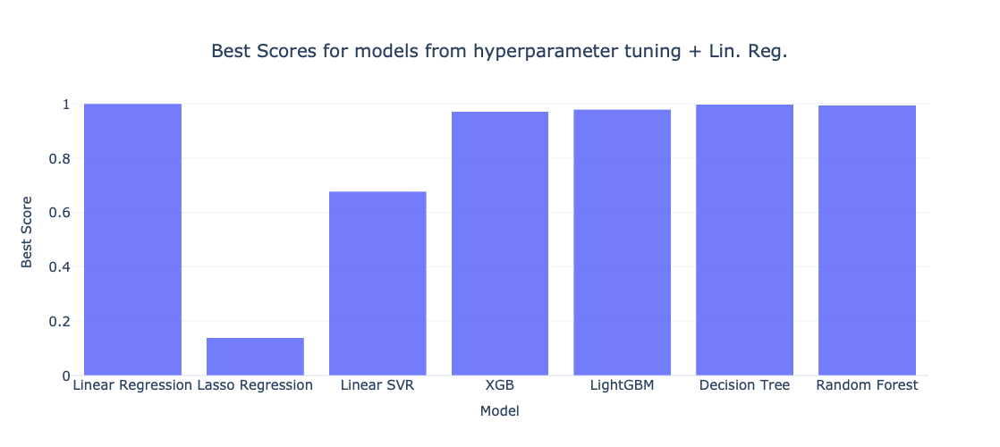

In [79]:
#"Feature scaling is very important whenever you are dealing with a ML algorithm 
#whose cost function involves some measure of distance in Euclidian space"
#https://www.linkedin.com/advice/3/how-does-feature-scaling-improve-linear-vm3dc
#Accessed 11/07/2024

#In linear regression approach want to "find the
#linear model that minimizes the average squared Euclidean distance between
#the prediction and the target"
#https://cs.mcgill.ca/~wlh/comp451/files/comp451_chap9.pdf
#Accessed 11/07/2024
#- therefore cost function based on a measure of 
#distance in Euclidian space, so do feature scaling hy z-score normalisation:

from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
sc_y = StandardScaler()

var = 0
cont_list_intern = []
cont_list_intern = cont_list[:]
for item in cont_list_intern[:]:
    if item == col_list[var]:
        cont_list_intern.remove(item)
feat_config = FeatureConfig(
    date="timestamp",
    target=col_list[var],
    original_target=col_list[var],
    continuous_features=cont_list_intern,
    categorical_features=cat,
    boolean_features=bool_,
    index_cols=["timestamp"],
    exogenous_features=[],
)

X_train, y_train, y_train_orig = feat_config.get_X_y(df=train, categorical=False, exogenous=False)

index_x = X_train.index
index_y = y_train.index
X_train = pd.DataFrame(sc_X.fit_transform(X_train), index=index_x, columns=sc_X.get_feature_names_out())
y_train = pd.DataFrame(sc_y.fit_transform(y_train), index=index_y, columns=sc_y.get_feature_names_out())
reg = LinearRegression().fit(X_train, y_train)
best_score_list.insert(0, reg.score(X_train, y_train))
#^https://www.w3schools.com/python/ref_list_insert.asp
#Accessed 19/07/2024

d = {'Model': ['Linear Regression', 'Lasso Regression', 'Linear SVR', 'XGB', 'LightGBM', 'Decision Tree', 'Random Forest'], 'Best Score': best_score_list}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Model",
    y = 'Best Score',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Best Scores for models from hyperparameter tuning + Lin. Reg.',
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Best Score", xlabel='Model')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/best_scores_for_models_hyperparameter_tuning_and_lin_reg.png")
fig.show()    

* A negative score for an estimator with R<sup>2</sup> on this data means Lasso is unlikely to be a good model (default scorer is estimator scorer in GridSearchCV (1); default scorer e.g. for Lasso is R<sup>2</sup> (2), if negative, model is worse that a constant model always predicting the mean of the variable (2)).
* Lasso poor (< 0.2, Linear SVR moderate (~ 0.6), the other models better, with Decision Tree and Random Forest implicated as potentially the best, (all score → 1), as well as Linear Regression

(1) - https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html  
^Accessed 16/07/2024   
(2) - https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LassoCV.html#sklearn.linear_model.LassoCV.score    
^Accessed 16/07/2024 

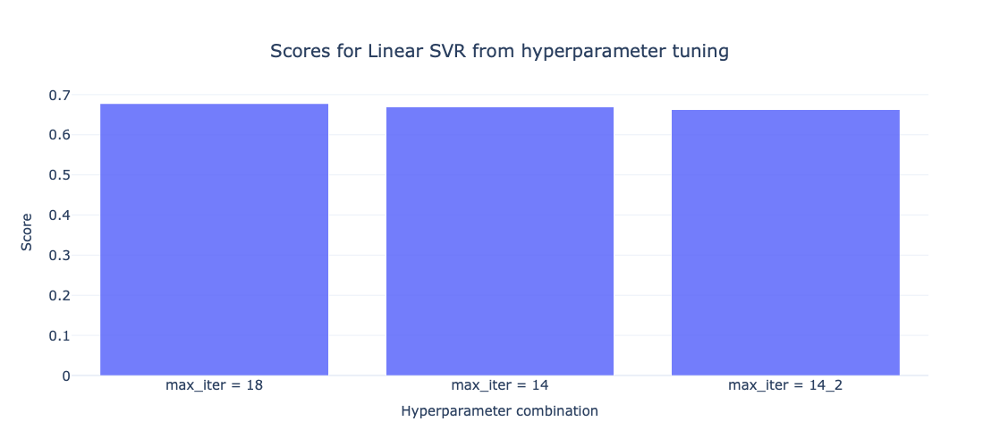

In [80]:
#If same hyperparameter combo different score number differently:
linearSVR_combo_list_2 = linearSVR_combo_list.copy()
for combo in range(len(linearSVR_combo_list_2)):
    if combo > 0:
        if linearSVR_combo_list_2[combo - 1] == linearSVR_combo_list_2[combo]:
            count = 1
            for instance in range(len(linearSVR_combo_list_2)):
                if linearSVR_combo_list_2[instance] == linearSVR_combo_list_2[combo]:
                    count += 1
            count_2 = 2
            count_3 = 0
            for instance in range(len(linearSVR_combo_list_2)):
                if linearSVR_combo_list_2[instance] == linearSVR_combo_list_2[combo]:
                    if count_3 > 0:
                        linearSVR_combo_list_2[instance] = linearSVR_combo_list_2[instance] + '_' + str(count_2)
                        count_2 += 1
                        count_3 += 1
                        if count_3 > 0:
                            if count_2 > count:
                                break
                    count_3 += 1
        else:
            if linearSVR_combo_list_2[combo] in linearSVR_combo_list_2[:combo]:
                count = 1
                for instance in range(len(linearSVR_combo_list_2)):
                    if linearSVR_combo_list_2[instance] == linearSVR_combo_list_2[combo]:
                        count += 1
                count_2 = 2
                count_3 = 0
                for instance in range(len(linearSVR_combo_list_2)):
                    if linearSVR_combo_list_2[instance] == linearSVR_combo_list_2[combo]:
                        if count_3 > 0:
                            linearSVR_combo_list_2[instance] = linearSVR_combo_list_2[instance] + '_' + str(count_2)
                            count_2 += 1
                            count_3 += 1
                            if count_3 > 0:
                                if count_2 > count:
                                    break
                        count_3 += 1
d = {'Hyperparameter combination': linearSVR_combo_list_2, 'Score': linearSVR_score_list}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Hyperparameter combination",
    y = 'Score',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Scores for Linear SVR from hyperparameter tuning',
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Score", xlabel='Hyperparameter combination')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/scores_for_linear_svr_hyperparameter_tuning.png")
fig.show()    

- max_iter = 18 gives the best score

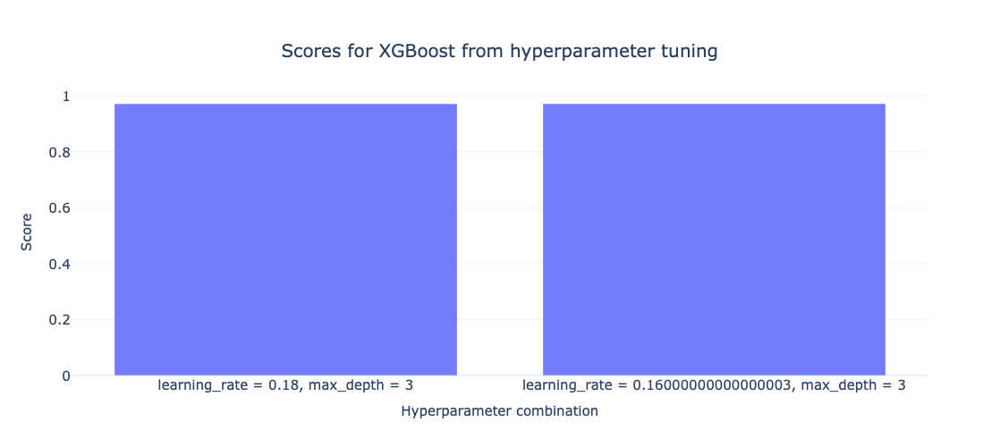

In [81]:
#If same hyperparameter combo different score number differently:
XGB_combo_list_2 = XGB_combo_list.copy()
for combo in range(len(XGB_combo_list_2)):
    if combo > 0:
        if XGB_combo_list_2[combo - 1] == XGB_combo_list_2[combo]:
            count = 1
            for instance in range(len(XGB_combo_list_2)):
                if XGB_combo_list_2[instance] == XGB_combo_list_2[combo]:
                    count += 1
            count_2 = 2
            count_3 = 0
            for instance in range(len(XGB_combo_list_2)):
                if XGB_combo_list_2[instance] == XGB_combo_list_2[combo]:
                    if count_3 > 0:
                        XGB_combo_list_2[instance] = XGB_combo_list_2[instance] + '_' + str(count_2)
                        count_2 += 1
                        count_3 += 1
                        if count_3 > 0:
                            if count_2 > count:
                                break
                    count_3 += 1
        else:
            if XGB_combo_list_2[combo] in XGB_combo_list_2[:combo]:
                count = 1
                for instance in range(len(XGB_combo_list_2)):
                    if XGB_combo_list_2[instance] == XGB_combo_list_2[combo]:
                        count += 1
                count_2 = 2
                count_3 = 0
                for instance in range(len(XGB_combo_list_2)):
                    if XGB_combo_list_2[instance] == XGB_combo_list_2[combo]:
                        if count_3 > 0:
                            XGB_combo_list_2[instance] = XGB_combo_list_2[instance] + '_' + str(count_2)
                            count_2 += 1
                            count_3 += 1
                            if count_3 > 0:
                                if count_2 > count:
                                    break
                        count_3 += 1
d = {'Hyperparameter combination': XGB_combo_list_2, 'Score': XGB_score_list}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Hyperparameter combination",
    y = 'Score',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Scores for XGBoost from hyperparameter tuning',
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Score", xlabel='Hyperparameter combination')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/scores_for_xgb_hyperparameter_tuning.png")
fig.show()    

- for XGB learning_rate = 0.16000000000000003, max_depth = 3 gives best score

- for Decision Tree best score for max_depth = 5, min_impurity_decrease = 0.0, min_samples_split = 4

# VALIDATION SET PREDICTION BY ML

In [16]:
hyp_nest_list

[[4],
 [18, 14, 14],
 [[0.18, 0.16000000000000003], [3, 3]],
 [[0.12], [2]],
 [[3], [0.0], [2]],
 [[3], [0.0], [6]]]

In [17]:
lasso_max_iter_list = hyp_nest_list[0]
linearSVR_max_iter_list = hyp_nest_list[1]
XGB_learning_rate_list = hyp_nest_list[2][0]
XGB_max_depth_list = hyp_nest_list[2][1]
LGBM_learning_rate_list = hyp_nest_list[3][0]
LGBM_max_depth_list = hyp_nest_list[3][1]
dtree_max_depth_list = hyp_nest_list[4][0]
dtree_min_impurity_decrease_list = hyp_nest_list[4][1]
dtree_min_samples_split_list = hyp_nest_list[4][2]
rfor_max_depth_list = hyp_nest_list[5][0]
rfor_min_impurity_decrease_list = hyp_nest_list[5][1]
rfor_min_samples_split_list = hyp_nest_list[5][2]

In [84]:
start = time.time()

In [85]:
y_pred_outer = test[col_list[0]]
zero_list_for_rows = []
for row in range(len(y_pred_outer)):
    y_pred_outer[row] = 0 #if all values zero forecast 0
    zero_list_for_rows.append(0)
all_preds = []
all_metrics = []
var_num_list = []
var_list = []
linear_list = [0]
lasso_max_iter_list = hyp_nest_list[0]
linearSVR_max_iter_list = hyp_nest_list[1]
XGB_learning_rate_list = hyp_nest_list[2][0]
XGB_max_depth_list = hyp_nest_list[2][1]
LGBM_learning_rate_list = hyp_nest_list[3][0]
LGBM_max_depth_list = hyp_nest_list[3][1]
dtree_max_depth_list = hyp_nest_list[4][0]
dtree_min_impurity_decrease_list = hyp_nest_list[4][1]
dtree_min_samples_split_list = hyp_nest_list[4][2]
rfor_max_depth_list = hyp_nest_list[5][0]
rfor_min_impurity_decrease_list = hyp_nest_list[5][1]
rfor_min_samples_split_list = hyp_nest_list[5][2]

file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/train_interim.pik'
# with open(file, 'wb') as f:
#     pickle.dump(train, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     train = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/test_interim.pik'
# with open(file, 'wb') as f:
#     pickle.dump(test, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     test = pickle.load(f) #load pickle file 'file' into variable
for run in range(10):
    for var in range(1):
    # for var in range(len(col_list)):
        cont_list_intern = []
        cont_list_intern = cont_list[:]
        for item in cont_list_intern[:]:
            if item == col_list[var]:
                cont_list_intern.remove(item)
        feat_config = FeatureConfig(
            date="timestamp",
            target=col_list[var],
            original_target=col_list[var],
            continuous_features=cont_list_intern,
            categorical_features=cat,
            boolean_features=bool_,
            index_cols=["timestamp"],
            exogenous_features=[],
        )
        missing_value_config = MissingValueConfig(
            bfill_columns=[],
            ffill_columns=[],
            zero_fill_columns=[],
        )
        for i in range(len(linear_list)):
            # eta=rates[rate]
            #"Feature scaling is very important whenever you are dealing with a ML algorithm 
            #whose cost function involves some measure of distance in Euclidian space"
            #https://www.linkedin.com/advice/3/how-does-feature-scaling-improve-linear-vm3dc
            #Accessed 11/07/2024
            
            #In linear regression approach want to "find the
            #linear model that minimizes the average squared Euclidean distance between
            #the prediction and the target"
            #https://cs.mcgill.ca/~wlh/comp451/files/comp451_chap9.pdf
            #Accessed 11/07/2024
            #- therefore cost function based on a measure of 
            #distance in Euclidian space, so do feature scaling hy z-score normalisation:
            
            from sklearn.preprocessing import StandardScaler
            sc_X = StandardScaler()
            sc_y = StandardScaler()
                
            models_to_run = [
            ModelConfig(model = LinearRegression(), name="Linear Regression", normalize=True, fill_missing=False),
            ]
            med_tr = statistics.median(train[col_list[var]]) 
            med_ts = statistics.median(test[col_list[var]])
            for model_config in range(len(models_to_run)):
                model_config_ = models_to_run[model_config]
                if med_tr == 0:
                    if med_ts == 0:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                    else:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                else:
                    model_config_ = model_config_.clone()
                    X_train, y_train, y_train_orig = feat_config.get_X_y(df=train, categorical=False, exogenous=False)
                    X_test, _, y_test_orig = feat_config.get_X_y(df=test, categorical=False, exogenous=False)
                    y_trial = y_test_orig
                transformer = None
                    # if var < 136:
                    # #if var < 140:
                    #     if seasonal_period_list[var] != 'not seasonal':
                    #         transformer = transformer_pipelines[col_list[var]]
                    #     else:
                    #         transformer=None
                    # found_output = col_list[var].find('seasonal')
                    # if found_output != -1:
                    #     found_output = col_list[var].find('median_total_price')
                    #     if found_output != -1:
                    #         index = name_list.index(col_list[var][0:24])
                    #         if seasonal_period_list[index] != 'not seasonal':
                    #             transformer = transformer_pipelines[transformer_pipelines.index(col_list[var])]
                    #         else:
                    #             transformer=None
                    #     found_output = col_list[var].find('median_base_price')
                    #     if found_output != -1:
                    #         index = name_list.index(col_list[var][0:23])
                    #         if seasonal_period_list[index] != 'not seasonal':
                    #             transformer = transformer_pipelines[transformer_pipelines.index(col_list[var])]
                    #         else:
                    #             transformer=None        
                    #     found_output = col_list[var].find('median_units_sold')       
                    #     if found_output != -1:
                    #         index = name_list.index(col_list[var][0:23])
                    #         if seasonal_period_list[index] != 'not seasonal':
                    #             transformer = transformer_pipelines[transformer_pipelines.index(col_list[var])]
                    #         else:
                    #             transformer=None
                    #     found_output = col_list[var].find('percent_featured')
                    #     if found_output != -1:
                    #         index = name_list.index(col_list[var][0:22])
                    #         if seasonal_period_list[index] != 'not seasonal':
                    #             transformer = transformer_pipelines[transformer_pipelines.index(col_list[var])]
                    #         else:
                    #             transformer=None
                    #     found_output = col_list[var].find('percent_display')
                    #     if found_output != -1:
                    #         index = name_list.index(col_list[var][0:21])
                    #         if seasonal_period_list[index] != 'not seasonal':
                    #             transformer = transformer_pipelines[transformer_pipelines.index(col_list[var])]
                    #         else:
                    #             transformer=None
                # found_output = col_list[var].find('ewma')
                # if found_output != -1:
                #     found_output = col_list[var].find('median_total_price')
                #     if found_output != -1:
                #         index = name_list.index(col_list[var][0:24])
                #         if seasonal_period_list[index] != 'not seasonal':
                #             transformer = transformer_pipelines[transformer_pipelines.index(col_list[var])]
                #         else:
                #             transformer=None
                #     found_output = col_list[var].find('median_base_price')
                #     if found_output != -1:
                #         index = name_list.index(col_list[var][0:23])
                #         if seasonal_period_list[index] != 'not seasonal':
                #             transformer = transformer_pipelines[transformer_pipelines.index(col_list[var])]
                #         else:
                #             transformer=None
                #     found_output = col_list[var].find('median_units_sold')       
                #     if found_output != -1:
                #         index = name_list.index(col_list[var][0:23])
                #         if seasonal_period_list[index] != 'not seasonal':
                #             transformer = transformer_pipelines[transformer_pipelines.index(col_list[var])]
                #         else:
                #             transformer=None
                #     found_output = col_list[var].find('percent_featured')
                #     if found_output != -1:
                #         index = name_list.index(col_list[var][0:22])
                #         if seasonal_period_list[index] != 'not seasonal':
                #             transformer = transformer_pipelines[transformer_pipelines.index(col_list[var])]
                #         else:
                #             transformer=None
                #     found_output = col_list[var].find('percent_display')
                #     if found_output != -1:
                #         index = name_list.index(col_list[var][0:21])
                #         if seasonal_period_list[index] != 'not seasonal':
                #             transformer = transformer_pipelines[transformer_pipelines.index(col_list[var])]
                #         else:
                #             transformer=None
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")
                    
                    #"Feature scaling is very important whenever you are dealing with a ML algorithm 
                    #whose cost function involves some measure of distance in Euclidian space"
                    #https://www.linkedin.com/advice/3/how-does-feature-scaling-improve-linear-vm3dc
                    #Accessed 11/07/2024
                    
                    #In linear regression approach want to "find the
                    #linear model that minimizes the average squared Euclidean distance between
                    #the prediction and the target"
                    #https://cs.mcgill.ca/~wlh/comp451/files/comp451_chap9.pdf
                    #Accessed 11/07/2024
                    #- therefore cost function based on a measure of 
                    #distance in Euclidian space, so do feature scaling hy z-score normalisation:
                    
                    index_x = X_train.index
                    index_y = y_train.index
                    X_train = pd.DataFrame(sc_X.fit_transform(X_train), index=index_x, columns=sc_X.get_feature_names_out())
                    y_train = pd.DataFrame(sc_y.fit_transform(y_train), index=index_y, columns=sc_y.get_feature_names_out())
                    if transformer == None:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig)
                    else:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig, transformer)
                    y_pred.name = "predictions"
                    y_pred = y_pred.to_frame()
                    y_pred.insert(1, "Variable", zero_list_for_rows, True)
                    y_pred.insert(2, 'Algorithm', zero_list_for_rows, True)
            for row in range(len(y_pred)):
                y_pred['Variable'][row] = col_list[var]
                y_pred['Algorithm'][row] = model_config_.name + "_auto_stat"
            metrics['Variable'] = col_list[var]
            metrics["Algorithm"] = model_config_.name + "_auto_stat"
            metrics['Linear Regression'] = 1
            metrics['Lasso Regression'] = 0
            metrics['Linear SVR'] = 0
            metrics['XGB'] = 0
            metrics['LightGBM'] = 0
            metrics['Decision Tree'] = 0
            metrics['Random Forest'] = 0
            metrics['max iter'] = np.nan
            metrics['learning rate'] = np.nan
            metrics['max depth'] = np.nan
            metrics['min samples split'] = np.nan
            metrics['min impurity decrease'] = np.nan
            if med_tr == 0:
                if med_ts == 0:
                    y_pred.insert(3, 'True values', zero_list_for_rows, True)
            else:
                y_pred['True values'] = y_test_orig.values
            all_preds.append(y_pred)
            all_metrics.append(metrics)    
            if run > 0:
                y_pred_prev = pd.concat([y_pred_prev, y_pred], names=['predictions', 'Variable', 'Algorithm', 'True values'])    
            else:
                y_pred_prev = y_pred  
        for i in range(len(lasso_max_iter_list)):
            
            #LassoCV needs data to be standardised (usually by observed variance) beforehand
            #Standardisation by z-score (z-score normalisation) is standardisation by [the square 
            #root of] the observed variance (1)
            #^https://www.universiteitleiden.nl/binaries/content/assets/science/mi/scripties/statscience/2019-2020/final-version_thesis_amy-vervoorn.pdf
            #Accessed 11/07/2024
            #(1) - https://inomics.com/blog/standardizing-the-data-of-different-scales-which-method-to-use-1036202#:~:text=Standardization%3A%20calculating%20Z%2Dscore,value%20from%20its%20average%20value).
            #Accessed 12/07/2024
            
            from sklearn.preprocessing import StandardScaler
            sc_X = StandardScaler()
            sc_y = StandardScaler()
            
            # eta=rates[rate]
            models_to_run = [
            ModelConfig(model = LassoCV(max_iter=lasso_max_iter_list[i]), name="Lasso Regression", normalize=True, fill_missing=False),
            ]
            med_tr = statistics.median(train[col_list[var]]) 
            med_ts = statistics.median(test[col_list[var]])
            for model_config in range(len(models_to_run)):
                model_config_ = models_to_run[model_config]
                if med_tr == 0:
                    if med_ts == 0:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                    else:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                else:
                    model_config_ = model_config_.clone()
                    X_train, y_train, y_train_orig = feat_config.get_X_y(df=train, categorical=False, exogenous=False)
                    X_test, _, y_test_orig = feat_config.get_X_y(df=test, categorical=False, exogenous=False)
                transformer = None
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")
                    #LassoCV needs data to be standardised (usually by observed variance) beforehand
                    #Standardisation by z-score (z-score normalisation) is standardisation by [the square 
                    #root of] the observed variance (1)
                    #^https://www.universiteitleiden.nl/binaries/content/assets/science/mi/scripties/statscience/2019-2020/final-version_thesis_amy-vervoorn.pdf
                    #Accessed 11/07/2024
                    #(1) - https://inomics.com/blog/standardizing-the-data-of-different-scales-which-method-to-use-1036202#:~:text=Standardization%3A%20calculating%20Z%2Dscore,value%20from%20its%20average%20value).
                    #Accessed 12/07/2024
                    index_x = X_train.index
                    index_y = y_train.index
                    X_train = pd.DataFrame(sc_X.fit_transform(X_train), index=index_x, columns=sc_X.get_feature_names_out())
                    y_train = pd.DataFrame(sc_y.fit_transform(y_train), index=index_y, columns=sc_y.get_feature_names_out())
                    if transformer == None:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig)
                    else:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig, transformer)
                    y_pred.name = "predictions"
                    y_pred = y_pred.to_frame()
                    y_pred.insert(1, "Variable", zero_list_for_rows, True)
                    y_pred.insert(2, 'Algorithm', zero_list_for_rows, True)
            for row in range(len(y_pred)):
                y_pred['Variable'][row] = col_list[var]
                y_pred['Algorithm'][row] = model_config_.name + "_auto_stat"
            metrics['Variable'] = col_list[var]
            metrics["Algorithm"] = model_config_.name + "_auto_stat"
            metrics['Linear Regression'] = 0
            metrics['Lasso Regression'] = 0
            metrics['Linear SVR'] = 0
            metrics['XGB'] = 0
            metrics['LightGBM'] = 0
            metrics['Decision Tree'] = 0
            metrics['Random Forest'] = 0
            metrics['max iter'] = np.nan
            metrics['learning rate'] = np.nan
            metrics['max depth'] = np.nan
            metrics['min samples split'] = np.nan
            metrics['min impurity decrease'] = np.nan
            metrics['Lasso Regression'] = 1
            metrics['max iter'] = lasso_max_iter_list[i]
            if med_tr == 0:
                if med_ts == 0:
                    y_pred.insert(3, 'True values', zero_list_for_rows, True)
            else:
                y_pred['True values'] = y_test_orig.values
            all_preds.append(y_pred)
            all_metrics.append(metrics)    
            y_pred_prev = pd.concat([y_pred_prev, y_pred], names=['predictions', 'Variable', 'Algorithm', 'True values'])
        for i in range(len(linearSVR_max_iter_list)):
            # eta=rates[rate]
                
            from sklearn.preprocessing import StandardScaler
            sc_X = StandardScaler()
            sc_y = StandardScaler()
    
            models_to_run = [
            ModelConfig(model = LinearSVR(max_iter=linearSVR_max_iter_list[i]), name="Linear SVR", normalize=True, fill_missing=False),
            ]
            med_tr = statistics.median(train[col_list[var]]) 
            med_ts = statistics.median(test[col_list[var]])
            for model_config in range(len(models_to_run)):
                model_config_ = models_to_run[model_config]
                if med_tr == 0:
                    if med_ts == 0:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                    else:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                else:
                    model_config_ = model_config_.clone()
                    X_train, y_train, y_train_orig = feat_config.get_X_y(df=train, categorical=False, exogenous=False)
                    X_test, _, y_test_orig = feat_config.get_X_y(df=test, categorical=False, exogenous=False)
                transformer = None
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")
                    index_x = X_train.index
                    index_y = y_train.index
                    X_train = pd.DataFrame(sc_X.fit_transform(X_train), index=index_x, columns=sc_X.get_feature_names_out())
                    y_train = pd.DataFrame(sc_y.fit_transform(y_train), index=index_y, columns=sc_y.get_feature_names_out())
                    if transformer == None:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig)
                    else:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig, transformer)
                    y_pred.name = "predictions"
                    y_pred = y_pred.to_frame()
                    y_pred.insert(1, "Variable", zero_list_for_rows, True)
                    y_pred.insert(2, 'Algorithm', zero_list_for_rows, True)
            for row in range(len(y_pred)):
                y_pred['Variable'][row] = col_list[var]
                y_pred['Algorithm'][row] = model_config_.name + "_auto_stat"
            metrics['Variable'] = col_list[var]
            metrics["Algorithm"] = model_config_.name + "_auto_stat"
            metrics['Linear Regression'] = 0
            metrics['Lasso Regression'] = 0
            metrics['Linear SVR'] = 0
            metrics['XGB'] = 0
            metrics['LightGBM'] = 0
            metrics['Decision Tree'] = 0
            metrics['Random Forest'] = 0
            metrics['max iter'] = np.nan
            metrics['learning rate'] = np.nan
            metrics['max depth'] = np.nan
            metrics['min samples split'] = np.nan
            metrics['min impurity decrease'] = np.nan
            metrics['Linear SVR'] = 1
            metrics['max iter'] = linearSVR_max_iter_list[i]
            if med_tr == 0:
                if med_ts == 0:
                    y_pred.insert(3, 'True values', zero_list_for_rows, True)
            else:
                y_pred['True values'] = y_test_orig.values
            all_preds.append(y_pred)
            all_metrics.append(metrics)    
            y_pred_prev = pd.concat([y_pred_prev, y_pred], names=['predictions', 'Variable', 'Algorithm', 'True values'])    
        for i in range(len(XGB_learning_rate_list)):
            eta=XGB_learning_rate_list[i]
            models_to_run = [
            ModelConfig(model = XGBRegressor(random_state=22, max_depth=XGB_max_depth_list[i], eta=eta), name="XGB", normalize=False, fill_missing=False),
            ]
            med_tr = statistics.median(train[col_list[var]]) 
            med_ts = statistics.median(test[col_list[var]])
            for model_config in range(len(models_to_run)):
                model_config_ = models_to_run[model_config]
                if med_tr == 0:
                    if med_ts == 0:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                    else:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                else:
                    model_config_ = model_config_.clone()
                    X_train, y_train, y_train_orig = feat_config.get_X_y(df=train, categorical=False, exogenous=False)
                    X_test, _, y_test_orig = feat_config.get_X_y(df=test, categorical=False, exogenous=False)
                transformer = None
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")
                    if transformer == None:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig)
                    else:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig, transformer)
                    y_pred.name = "predictions"
                    y_pred = y_pred.to_frame()
                    y_pred.insert(1, "Variable", zero_list_for_rows, True)
                    y_pred.insert(2, 'Algorithm', zero_list_for_rows, True)
            for row in range(len(y_pred)):
                y_pred['Variable'][row] = col_list[var]
                y_pred['Algorithm'][row] = model_config_.name + "_auto_stat"
            metrics['Variable'] = col_list[var]
            metrics["Algorithm"] = model_config_.name + "_auto_stat"
            metrics['Linear Regression'] = 0
            metrics['Lasso Regression'] = 0
            metrics['Linear SVR'] = 0
            metrics['XGB'] = 0
            metrics['LightGBM'] = 0
            metrics['Decision Tree'] = 0
            metrics['Random Forest'] = 0
            metrics['max iter'] = np.nan
            metrics['learning rate'] = np.nan
            metrics['max depth'] = np.nan
            metrics['min samples split'] = np.nan
            metrics['min impurity decrease'] = np.nan
            metrics['XGB'] = 1
            metrics['max depth'] = XGB_max_depth_list[i]
            metrics['learning rate'] = XGB_learning_rate_list[i]
            if med_tr == 0:
                if med_ts == 0:
                    y_pred.insert(3, 'True values', zero_list_for_rows, True)
            else:
                y_pred['True values'] = y_test_orig.values
            all_preds.append(y_pred)
            all_metrics.append(metrics)    
            y_pred_prev = pd.concat([y_pred_prev, y_pred], names=['predictions', 'Variable', 'Algorithm', 'True values'])    
        for i in range(len(LGBM_learning_rate_list)):
            # eta=rates[rate]
            models_to_run = [
            ModelConfig(model = LGBMRegressor(random_state=22, max_depth=LGBM_max_depth_list[i], learning_rate=LGBM_learning_rate_list[i]), name="LightGBM", normalize=False, fill_missing=False),
            ]
            med_tr = statistics.median(train[col_list[var]]) 
            med_ts = statistics.median(test[col_list[var]])
            for model_config in range(len(models_to_run)):
                model_config_ = models_to_run[model_config]
                if med_tr == 0:
                    if med_ts == 0:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                    else:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                else:
                    model_config_ = model_config_.clone()
                    X_train, y_train, y_train_orig = feat_config.get_X_y(df=train, categorical=False, exogenous=False)
                    X_test, _, y_test_orig = feat_config.get_X_y(df=test, categorical=False, exogenous=False)
                transformer = None
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")
                    if transformer == None:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig)
                    else:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig, transformer)
                    y_pred.name = "predictions"
                    y_pred = y_pred.to_frame()
                    y_pred.insert(1, "Variable", zero_list_for_rows, True)
                    y_pred.insert(2, 'Algorithm', zero_list_for_rows, True)
            for row in range(len(y_pred)):
                y_pred['Variable'][row] = col_list[var]
                y_pred['Algorithm'][row] = model_config_.name + "_auto_stat"
            metrics['Variable'] = col_list[var]
            metrics["Algorithm"] = model_config_.name + "_auto_stat"
            metrics['Linear Regression'] = 0
            metrics['Lasso Regression'] = 0
            metrics['Linear SVR'] = 0
            metrics['XGB'] = 0
            metrics['LightGBM'] = 0
            metrics['Decision Tree'] = 0
            metrics['Random Forest'] = 0
            metrics['max iter'] = np.nan
            metrics['learning rate'] = np.nan
            metrics['max depth'] = np.nan
            metrics['min samples split'] = np.nan
            metrics['min impurity decrease'] = np.nan
            metrics['LightGBM'] = 1
            metrics['learning rate'] = LGBM_learning_rate_list[i]
            metrics['max depth'] = LGBM_max_depth_list[i]
            if med_tr == 0:
                if med_ts == 0:
                    y_pred.insert(3, 'True values', zero_list_for_rows, True)
            else:
                y_pred['True values'] = y_test_orig.values
            all_preds.append(y_pred)
            all_metrics.append(metrics)    
            y_pred_prev = pd.concat([y_pred_prev, y_pred], names=['predictions', 'Variable', 'Algorithm', 'True values'])    
        for i in range(len(dtree_max_depth_list)):
            # eta=rates[rate]
            models_to_run = [
            ModelConfig(model = DecisionTreeRegressor(random_state=22, max_depth=dtree_max_depth_list[i], min_samples_split=dtree_min_samples_split_list[i], min_impurity_decrease=dtree_min_impurity_decrease_list[i]), name="Decision Tree", normalize=False, fill_missing=False),
            ]
            med_tr = statistics.median(train[col_list[var]]) 
            med_ts = statistics.median(test[col_list[var]])
            for model_config in range(len(models_to_run)):
                model_config_ = models_to_run[model_config]
                if med_tr == 0:
                    if med_ts == 0:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                    else:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                else:
                    model_config_ = model_config_.clone()
                    X_train, y_train, y_train_orig = feat_config.get_X_y(df=train, categorical=False, exogenous=False)
                    X_test, _, y_test_orig = feat_config.get_X_y(df=test, categorical=False, exogenous=False)
                transformer = None
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")
                    if transformer == None:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig)
                    else:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig, transformer)
                    y_pred.name = "predictions"
                    y_pred = y_pred.to_frame()
                    y_pred.insert(1, "Variable", zero_list_for_rows, True)
                    y_pred.insert(2, 'Algorithm', zero_list_for_rows, True)
            for row in range(len(y_pred)):
                y_pred['Variable'][row] = col_list[var]
                y_pred['Algorithm'][row] = model_config_.name + "_auto_stat"
            metrics['Variable'] = col_list[var]
            metrics["Algorithm"] = model_config_.name + "_auto_stat"
            metrics['Linear Regression'] = 0
            metrics['Lasso Regression'] = 0
            metrics['Linear SVR'] = 0
            metrics['XGB'] = 0
            metrics['LightGBM'] = 0
            metrics['Decision Tree'] = 0
            metrics['Random Forest'] = 0
            metrics['max iter'] = np.nan
            metrics['learning rate'] = np.nan
            metrics['max depth'] = np.nan
            metrics['min samples split'] = np.nan
            metrics['min impurity decrease'] = np.nan
            metrics['Decision Tree'] = 1
            metrics['max depth'] = dtree_max_depth_list[i]
            metrics['min samples split'] = dtree_min_samples_split_list[i]
            metrics['min impurity decrease'] = dtree_min_impurity_decrease_list[i]
            if med_tr == 0:
                if med_ts == 0:
                    y_pred.insert(3, 'True values', zero_list_for_rows, True)
            else:
                y_pred['True values'] = y_test_orig.values
            all_preds.append(y_pred)
            all_metrics.append(metrics)    
            y_pred_prev = pd.concat([y_pred_prev, y_pred], names=['predictions', 'Variable', 'Algorithm', 'True values'])    
        for i in range(len(rfor_max_depth_list)):
            # eta=rates[rate]
            models_to_run = [
            ModelConfig(model = RandomForestRegressor(random_state=22, max_depth=rfor_max_depth_list[i], min_samples_split=rfor_min_samples_split_list[i], min_impurity_decrease=rfor_min_impurity_decrease_list[i]), name="Random Forest", normalize=False, fill_missing=False),
            ]
            med_tr = statistics.median(train[col_list[var]]) 
            med_ts = statistics.median(test[col_list[var]])
            for model_config in range(len(models_to_run)):
                model_config_ = models_to_run[model_config]
                if med_tr == 0:
                    if med_ts == 0:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                    else:
                        var_num_list.append(var)
                        var_list.append(col_list[var])
                        y_pred = y_pred_outer
                        y_pred[y_pred.columns.values[0]].name = "predictions"
                        metrics = {
                                    "Algorithm": model_config_.name + "_auto_stat",
                                    "MAE": 0,
                                    "MSE": 0,
                                    "MASE": 0,
                                    "Forecast Bias": 0
                                }
                else:
                    model_config_ = model_config_.clone()
                    X_train, y_train, y_train_orig = feat_config.get_X_y(df=train, categorical=False, exogenous=False)
                    X_test, _, y_test_orig = feat_config.get_X_y(df=test, categorical=False, exogenous=False)
                transformer = None
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")
                    if transformer == None:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig)
                    else:
                        y_pred, metrics, feat_df = evaluate_model(model_config_, feat_config, missing_value_config, X_train, y_train, X_test, y_test_orig, y_train_orig, transformer)
                    y_pred.name = "predictions"
                    y_pred = y_pred.to_frame()
                    y_pred.insert(1, "Variable", zero_list_for_rows, True)
                    y_pred.insert(2, 'Algorithm', zero_list_for_rows, True)
            for row in range(len(y_pred)):
                y_pred['Variable'][row] = col_list[var]
                y_pred['Algorithm'][row] = model_config_.name + "_auto_stat"
            metrics['Variable'] = col_list[var]
            metrics["Algorithm"] = model_config_.name + "_auto_stat"
            metrics['Linear Regression'] = 0
            metrics['Lasso Regression'] = 0
            metrics['Linear SVR'] = 0
            metrics['XGB'] = 0
            metrics['LightGBM'] = 0
            metrics['Decision Tree'] = 0
            metrics['Random Forest'] = 0
            metrics['max iter'] = np.nan
            metrics['learning rate'] = np.nan
            metrics['max depth'] = np.nan
            metrics['min samples split'] = np.nan
            metrics['min impurity decrease'] = np.nan
            metrics['Random Forest'] = 1
            metrics['max depth'] = rfor_max_depth_list[i]
            metrics['min samples split'] = rfor_min_samples_split_list[i]
            metrics['min impurity decrease'] = rfor_min_impurity_decrease_list[i]
            if med_tr == 0:
                if med_ts == 0:
                    y_pred.insert(3, 'True values', zero_list_for_rows, True)
            else:
                y_pred['True values'] = y_test_orig.values
            all_preds.append(y_pred)
            all_metrics.append(metrics)    
            y_pred_prev = pd.concat([y_pred_prev, y_pred], names=['predictions', 'Variable', 'Algorithm', 'True values'])    
    
pred_df = y_pred_prev
metric_df = pd.DataFrame(all_metrics)
print('done!')

/tmp/ipykernel_15498/1530950232.py:4: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:4: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:4: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:4: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treat

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3586
[LightGBM] [Info] Number of data points in the train set: 114, number of used features: 181
[LightGBM] [Info] Start training from score 188.443750
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '679023median_total_price' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Random For

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3586
[LightGBM] [Info] Number of data points in the train set: 114, number of used features: 181
[LightGBM] [Info] Start training from score 188.443750
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '679023median_total_price' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Random For

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3586
[LightGBM] [Info] Number of data points in the train set: 114, number of used features: 181
[LightGBM] [Info] Start training from score 188.443750
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

/tmp/ipykernel_15498/1530950232.py:639: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:639: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '679023median_total_price' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/tmp/ipykernel_15498/1530950232.py:640: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:640: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Decision T

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3586
[LightGBM] [Info] Number of data points in the train set: 114, number of used features: 181
[LightGBM] [Info] Start training from score 188.443750
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '679023median_total_price' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Random For

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3586
[LightGBM] [Info] Number of data points in the train set: 114, number of used features: 181
[LightGBM] [Info] Start training from score 188.443750
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '679023median_total_price' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Random For

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3586
[LightGBM] [Info] Number of data points in the train set: 114, number of used features: 181
[LightGBM] [Info] Start training from score 188.443750
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '679023median_total_price' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Random For

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3586
[LightGBM] [Info] Number of data points in the train set: 114, number of used features: 181
[LightGBM] [Info] Start training from score 188.443750
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '679023median_total_price' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Random For

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3586
[LightGBM] [Info] Number of data points in the train set: 114, number of used features: 181
[LightGBM] [Info] Start training from score 188.443750
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

/tmp/ipykernel_15498/1530950232.py:639: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:639: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '679023median_total_price' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/tmp/ipykernel_15498/1530950232.py:640: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:640: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Decision T

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3586
[LightGBM] [Info] Number of data points in the train set: 114, number of used features: 181
[LightGBM] [Info] Start training from score 188.443750
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '679023median_total_price' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Random For

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3586
[LightGBM] [Info] Number of data points in the train set: 114, number of used features: 181
[LightGBM] [Info] Start training from score 188.443750
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:717: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '679023median_total_price' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/tmp/ipykernel_15498/1530950232.py:718: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Random For

In [86]:
end = time.time()
print('secs: ', (end - start)) # time in seconds
print('min: ', (end - start)/60) # time in min

secs:  81.93492817878723
min:  1.3655821363131204


In [143]:
metric_df

,Algorithm,MAE,MSE,MASE,Forecast Bias,Variable,Linear Regression,Lasso Regression,Linear SVR,XGB,LightGBM,Decision Tree,Random Forest,max iter,learning rate,max depth,min samples split,min impurity decrease
0,Linear Regression_auto_stat,6.207416e+01,3.856081e+03,7.011926e+00,3.443542e+01,679023median_total_price,1,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN
1,Lasso Regression_auto_stat,1.057853e+02,1.119522e+04,1.194956e+01,5.868405e+01,679023median_total_price,0,1,0,0,0,0,0,4.0,NaN,NaN,NaN,NaN
2,Linear SVR_auto_stat,1.460754e+02,2.134171e+04,1.650074e+01,8.103481e+01,679023median_total_price,0,0,1,0,0,0,0,18.0,NaN,NaN,NaN,NaN
3,Linear SVR_auto_stat,1.538610e+02,2.367623e+04,1.738021e+01,8.535386e+01,679023median_total_price,0,0,1,0,0,0,0,14.0,NaN,NaN,NaN,NaN
4,Linear SVR_auto_stat,1.551383e+02,2.407122e+04,1.752449e+01,8.606243e+01,679023median_total_price,0,0,1,0,0,0,0,14.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,XGB_auto_stat,8.914345e-05,1.619962e-08,1.006969e-05,-8.553863e-06,679023median_total_price,0,0,0,1,0,0,0,NaN,0.18,3.0,NaN,NaN
96,XGB_auto_stat,5.387156e-04,5.783092e-07,6.085356e-05,2.908314e-04,679023median_total_price,0,0,0,1,0,0,0,NaN,0.16,3.0,NaN,NaN
97,LightGBM_auto_stat,1.797021e-01,4.815939e-02,2.029923e-02,-9.568705e-02,679023median_total_price,0,0,0,0,1,0,0,NaN,0.12,2.0,NaN,NaN
98,Decision Tree_auto_stat,1.136868e-13,1.292470e-26,1.284212e-14,-9.294140e-14,679023median_total_price,0,0,0,0,0,1,0,NaN,NaN,3.0,2.0,0.0


In [144]:
pred_df

,predictions,Variable,Algorithm,True values
timestamp,,,,
2013-03-18,119.428719,679023median_total_price,Linear Regression_auto_stat,180.2625
2013-03-25,119.561859,679023median_total_price,Linear Regression_auto_stat,180.2625
2013-04-01,117.390653,679023median_total_price,Linear Regression_auto_stat,180.2625
2013-04-08,116.634489,679023median_total_price,Linear Regression_auto_stat,180.2625
2013-04-15,116.625152,679023median_total_price,Linear Regression_auto_stat,180.2625
...,...,...,...,...
2013-06-24,180.262500,679023median_total_price,Random Forest_auto_stat,180.2625
2013-07-01,180.262500,679023median_total_price,Random Forest_auto_stat,180.2625
2013-07-08,180.262500,679023median_total_price,Random Forest_auto_stat,180.2625


Pickle predictions and metrics:

In [5]:
#Pickle predictions and metrics:
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/metric_df_2.pik'
# with open(file, 'wb') as f:
#     pickle.dump(metric_df, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     metric_df = pickle.load(f) #load pickle file 'file' into variable
file = '/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/pred_df_2.pik'
# with open(file, 'wb') as f:
#     pickle.dump(pred_df, f) #write df to .pik file on disk
with open(file, 'rb') as f:
     pred_df = pickle.load(f) #load pickle file 'file' into variable

Linear SVR and XGBoost have multiple unique hyperparameter values to compare from tuning - compare only these within models  
For all plot median metric score and model as bar chart:

In [ ]:
#Check path:
#for p in sys.path: print(p)
#Add src to path:
# sys.path.insert(0, '/Users/harrybakhshi/Desktop/Python_notes/Modern-Time-Series-Forecasting-with-Python-main/src')
#for p in sys.path: print(p)

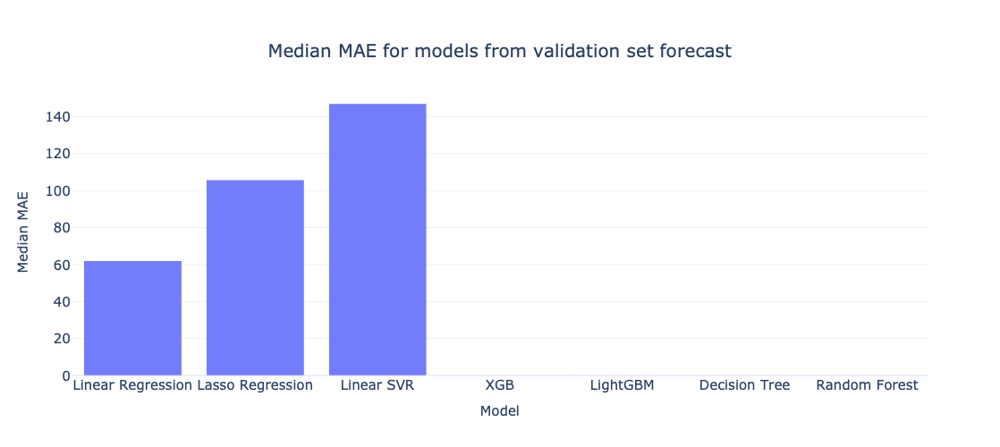

XGB 0.0003139295076057112
LGBM 0.1797020818730833
Decision Tree 1.1368683772161603e-13
Random forest 3.410605131648481e-13


In [117]:
median_mae_list = []
median_mae_list.append(statistics.median(metric_df[metric_df['Linear Regression'] == 1]['MAE']))
median_mae_list.append(statistics.median(metric_df[metric_df['Lasso Regression'] == 1]['MAE']))
median_mae_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1]['MAE']))
median_mae_list.append(statistics.median(metric_df[metric_df['XGB'] == 1]['MAE']))
median_mae_list.append(statistics.median(metric_df[metric_df['LightGBM'] == 1]['MAE']))
median_mae_list.append(statistics.median(metric_df[metric_df['Decision Tree'] == 1]['MAE']))
median_mae_list.append(statistics.median(metric_df[metric_df['Random Forest'] == 1]['MAE']))
model_list = ['Linear Regression', 'Lasso Regression', 'Linear SVR', 'XGB', 'LightGBM', 'Decision Tree', 'Random Forest']
pop_list = []
median_mae_list_2 = median_mae_list
for mae in range(len(median_mae_list)):
    if pd.isnull(median_mae_list[mae]):
        pop_list.append(mae)
loop_list_mae = median_mae_list.copy()
loop_list_models = model_list.copy()
if len(pop_list) > 1:
    for index in range(len(pop_list), -1, -1):
        median_mae_list.pop(median_mae_list.index(loop_list_mae[pop_list[index]]))
        model_list.pop(model_list.index(loop_list_models[pop_list[index]]))
else:
    for index in range(len(pop_list)):
        median_mae_list.pop(median_mae_list.index(loop_list_mae[pop_list[index]]))
        model_list.pop(model_list.index(loop_list_models[pop_list[index]]))
d = {'Model': model_list, 'Median MAE': median_mae_list}
# d = {'Model': model_list[0:2], 'Median MAE': median_mae_list[0:2]}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Model",
    y = 'Median MAE',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median MAE for models from validation set forecast'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median MAE", xlabel='Model')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_mae_models_validation_set_forecast.png")
fig.show() 
print('XGB', median_mae_list[3])
print('LGBM', median_mae_list[4])
print('Decision Tree', median_mae_list[5])
print('Random forest', median_mae_list[6])

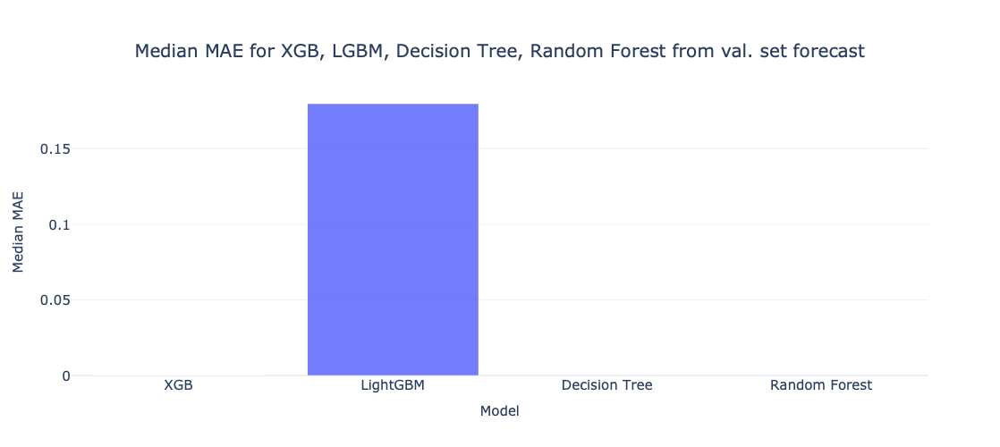

XGB 0.0003139295076057112
LGBM 0.1797020818730833
Decision Tree 1.1368683772161603e-13
Random forest 3.410605131648481e-13


In [118]:
d = {'Model': model_list[3:], 'Median MAE': median_mae_list[3:]}
# d = {'Model': model_list[0:2], 'Median MAE': median_mae_list[0:2]}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Model",
    y = 'Median MAE',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median MAE for XGB, LGBM, Decision Tree, Random Forest from val. set forecast'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median MAE", xlabel='Model')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_mae_better_models_validation_set_forecast.png")
fig.show()
print('XGB', median_mae_list[3])
print('LGBM', median_mae_list[4])
print('Decision Tree', median_mae_list[5])
print('Random forest', median_mae_list[6])

- MAE extremely high for Linear Regression, Lasso Regression and Linear SVR (>> 1), low for XGB, LightGBM (~0.2), extremely low for Random Forest and Decision Tree (<<< 0.1)

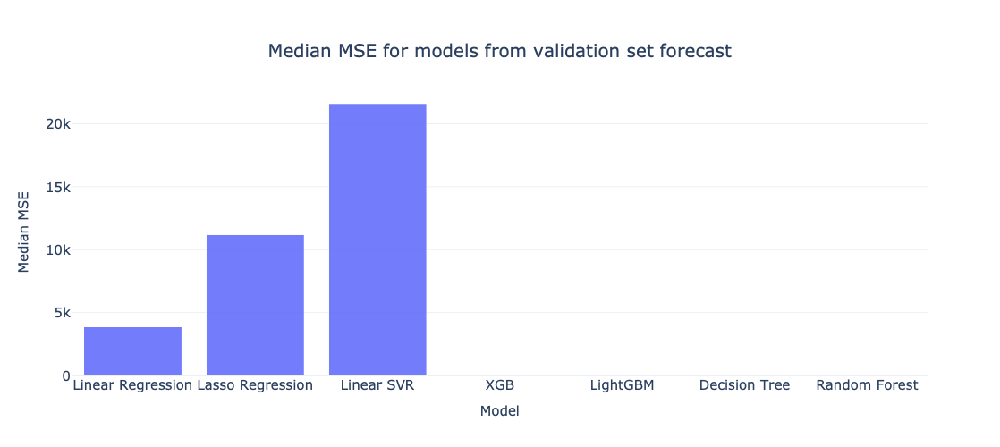

XGB 2.9725439257716093e-07
LGBM 0.048159385245615124
Decision Tree 1.2924697071141057e-26
Random forest 1.1632227364026952e-25


In [8]:
median_mse_list = []
median_mse_list.append(statistics.median(metric_df[metric_df['Linear Regression'] == 1]['MSE']))
median_mse_list.append(statistics.median(metric_df[metric_df['Lasso Regression'] == 1]['MSE']))
median_mse_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1]['MSE']))
median_mse_list.append(statistics.median(metric_df[metric_df['XGB'] == 1]['MSE']))
median_mse_list.append(statistics.median(metric_df[metric_df['LightGBM'] == 1]['MSE']))
median_mse_list.append(statistics.median(metric_df[metric_df['Decision Tree'] == 1]['MSE']))
median_mse_list.append(statistics.median(metric_df[metric_df['Random Forest'] == 1]['MSE']))
model_list = ['Linear Regression', 'Lasso Regression', 'Linear SVR', 'XGB', 'LightGBM', 'Decision Tree', 'Random Forest']
pop_list = []
median_mse_list_2 = median_mse_list
for mse in range(len(median_mse_list)):
    if pd.isnull(median_mse_list[mse]):
        pop_list.append(mse)
loop_list_mse = median_mse_list.copy()
loop_list_models = model_list.copy()
if len(pop_list) > 1:
    for index in range(len(pop_list), -1, -1):
        median_mse_list.pop(median_mse_list.index(loop_list_mse[pop_list[index]]))
        model_list.pop(model_list.index(loop_list_models[pop_list[index]]))
else:
    for index in range(len(pop_list)):
        median_mse_list.pop(median_mse_list.index(loop_list_mse[pop_list[index]]))
        model_list.pop(model_list.index(loop_list_models[pop_list[index]]))
d = {'Model': model_list, 'Median MSE': median_mse_list}
# d = {'Model': model_list[0:2], 'Median MSE': median_mse_list[0:2]}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Model",
    y = 'Median MSE',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median MSE for models from validation set forecast'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median MSE", xlabel='Model')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_mse_models_validation_set_forecast.png")
fig.show()
print('XGB', median_mse_list[3])
print('LGBM', median_mse_list[4])
print('Decision Tree', median_mse_list[5])
print('Random forest', median_mse_list[6])

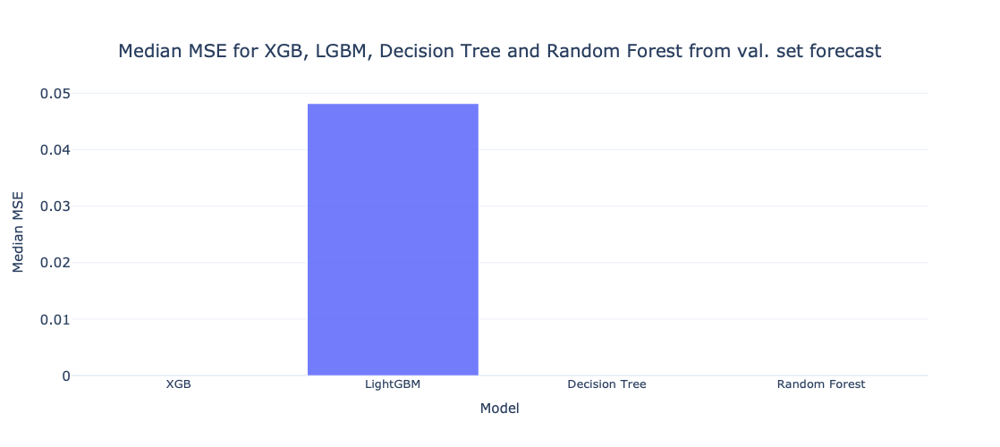

XGB 2.9725439257716093e-07
LGBM 0.048159385245615124
Decision Tree 1.2924697071141057e-26
Random forest 1.1632227364026952e-25


In [120]:
d = {'Model': model_list[3:], 'Median MSE': median_mse_list[3:]}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Model",
    y = 'Median MSE',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median MSE for XGB, LGBM, Decision Tree and Random Forest from val. set forecast',
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median MSE", xlabel='Model')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=13),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_mse_best_models_validation_set_forecast.png")
fig.show()
print('XGB', median_mse_list[3])
print('LGBM', median_mse_list[4])
print('Decision Tree', median_mse_list[5])
print('Random forest', median_mse_list[6])

- MSE extremely high for Linear Regression, Lasso Regression and Linear SVR (>> 1), very low for LightGBM (~0.05), extremely low for XGB, Random Forest and for Decision Tree (<<< 0.01)

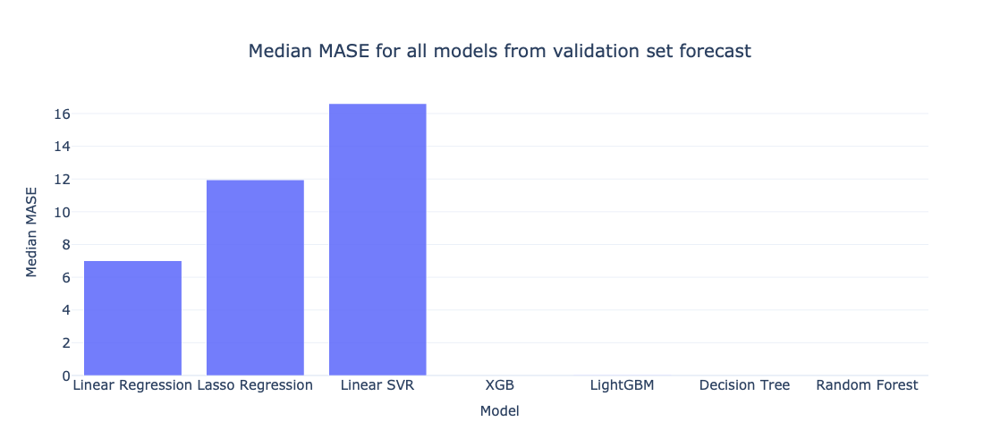

XGB 3.546162279146836e-05
LGBM 0.020299230520976076
Decision Tree 1.2842117921270171e-14
Random forest 3.85263537638105e-14


In [121]:
median_mase_list = []
median_mase_list.append(statistics.median(metric_df[metric_df['Linear Regression'] == 1]['MASE']))
median_mase_list.append(statistics.median(metric_df[metric_df['Lasso Regression'] == 1]['MASE']))
median_mase_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1]['MASE']))
median_mase_list.append(statistics.median(metric_df[metric_df['XGB'] == 1]['MASE']))
median_mase_list.append(statistics.median(metric_df[metric_df['LightGBM'] == 1]['MASE']))
median_mase_list.append(statistics.median(metric_df[metric_df['Decision Tree'] == 1]['MASE']))
median_mase_list.append(statistics.median(metric_df[metric_df['Random Forest'] == 1]['MASE']))
model_list = ['Linear Regression', 'Lasso Regression', 'Linear SVR', 'XGB', 'LightGBM', 'Decision Tree', 'Random Forest']
pop_list = []
median_mase_list_2 = median_mase_list
for mase in range(len(median_mase_list)):
    if pd.isnull(median_mase_list[mase]):
        pop_list.append(mase)
loop_list_mase = median_mase_list.copy()
loop_list_models = model_list.copy()
if len(pop_list) > 1:
    for index in range(len(pop_list), -1, -1):
        median_mase_list.pop(median_mase_list.index(loop_list_mase[pop_list[index]]))
        model_list.pop(model_list.index(loop_list_models[pop_list[index]]))
else:
     for index in range(len(pop_list)):
        median_mase_list.pop(median_mase_list.index(loop_list_mase[pop_list[index]]))
        model_list.pop(model_list.index(loop_list_models[pop_list[index]]))
d = {'Model': model_list, 'Median MASE': median_mase_list}
# d = {'Model': model_list[0:2], 'Median MASE': median_mase_list[0:2]}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Model",
    y = 'Median MASE',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median MASE for all models from validation set forecast'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median MASE", xlabel='Model')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_mase_all_models_validation_set_forecast.png")
fig.show()
print('XGB', median_mase_list[3])
print('LGBM', median_mase_list[4])
print('Decision Tree', median_mase_list[5])
print('Random forest', median_mase_list[6])

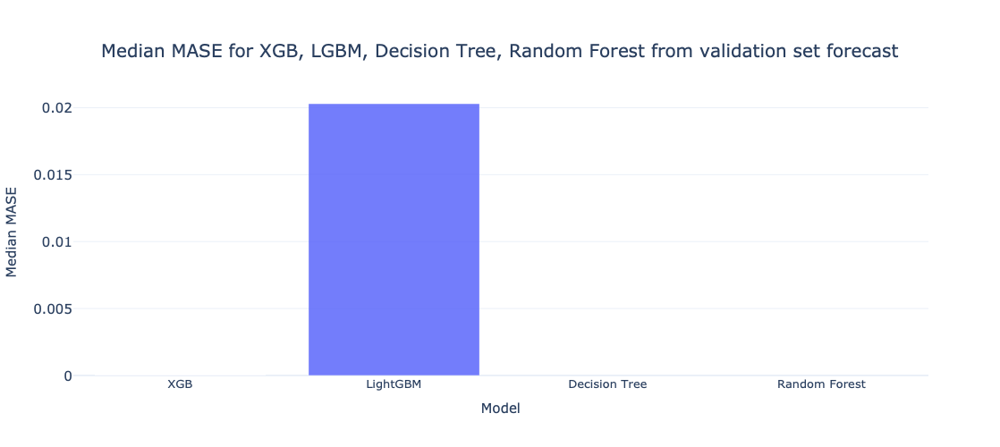

XGB 3.546162279146836e-05
LGBM 0.020299230520976076
Decision Tree 1.2842117921270171e-14
Random forest 3.85263537638105e-14


In [122]:
d = {'Model': model_list[3:], 'Median MASE': median_mase_list[3:]}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Model",
    y = 'Median MASE',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median MASE for XGB, LGBM, Decision Tree, Random Forest from validation set forecast',
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median MASE", xlabel='Model')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=13),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_mase_best_models_validation_set_forecast.png")
fig.show()
print('XGB', median_mase_list[3])
print('LGBM', median_mase_list[4])
print('Decision Tree', median_mase_list[5])
print('Random forest', median_mase_list[6])

- MASE high for Linear Regression, Lasso Regression, Linear SVR (> 5), low for LightGBM (< 0.05), extremely low for XGB, Decision Tree, Random Forest (<<< 0.01)

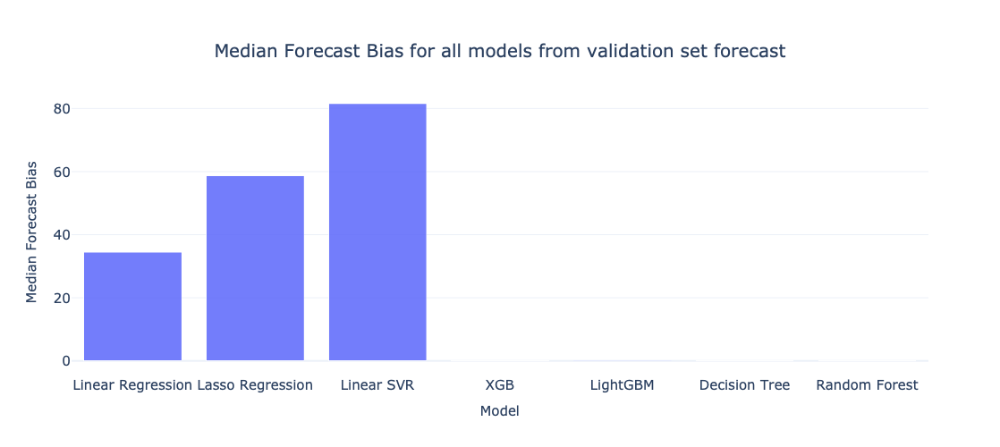

XGB 0.00014113874501067245
LGBM -0.09568704579989908
Decision Tree -9.29414036169548e-14
Random forest -1.9916015060776024e-13


In [9]:
median_fbias_list = []
median_fbias_list.append(statistics.median(metric_df[metric_df['Linear Regression'] == 1]['Forecast Bias']))
median_fbias_list.append(statistics.median(metric_df[metric_df['Lasso Regression'] == 1]['Forecast Bias']))
median_fbias_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1]['Forecast Bias']))
median_fbias_list.append(statistics.median(metric_df[metric_df['XGB'] == 1]['Forecast Bias']))
median_fbias_list.append(statistics.median(metric_df[metric_df['LightGBM'] == 1]['Forecast Bias']))
median_fbias_list.append(statistics.median(metric_df[metric_df['Decision Tree'] == 1]['Forecast Bias']))
median_fbias_list.append(statistics.median(metric_df[metric_df['Random Forest'] == 1]['Forecast Bias']))
model_list = ['Linear Regression', 'Lasso Regression', 'Linear SVR', 'XGB', 'LightGBM', 'Decision Tree', 'Random Forest']
pop_list = []
median_fbias_list_2 = median_fbias_list
for fbias in range(len(median_fbias_list)):
    if pd.isnull(median_fbias_list[fbias]):
        pop_list.append(fbias)
loop_list_fbias = median_fbias_list.copy()
loop_list_models = model_list.copy()
if len(pop_list) > 1:
    for index in range(len(pop_list), -1, -1):
        median_fbias_list.pop(median_fbias_list.index(loop_list_fbias[pop_list[index]]))
        model_list.pop(model_list.index(loop_list_models[pop_list[index]]))
else:
    for index in range(len(pop_list)):
        median_fbias_list.pop(median_fbias_list.index(loop_list_fbias[pop_list[index]]))
        model_list.pop(model_list.index(loop_list_models[pop_list[index]]))
d = {'Model': model_list, 'Median Forecast Bias' : median_fbias_list}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Model",
    y = 'Median Forecast Bias',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median Forecast Bias for all models from validation set forecast'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median Forecast Bias", xlabel='Model')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_fbias_all_models_validation_set_forecast.png")
fig.show()
print('XGB', median_fbias_list[3])
print('LGBM', median_fbias_list[4])
print('Decision Tree', median_fbias_list[5])
print('Random forest', median_fbias_list[6])

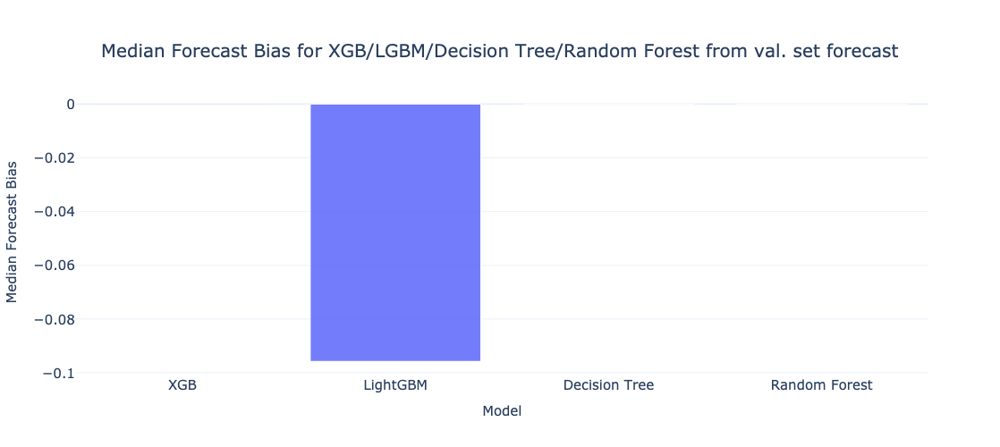

XGB 0.00014113874501067245
LGBM -0.09568704579989908
Decision Tree -9.29414036169548e-14
Random forest -1.9916015060776024e-13


In [10]:
d = {'Model': model_list[3:], 'Median Forecast Bias' : median_fbias_list[3:]}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Model",
    y = 'Median Forecast Bias',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median Forecast Bias for XGB/LGBM/Decision Tree/Random Forest from val. set forecast'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median Forecast Bias", xlabel='Model')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_fbias_all_models_validation_set_forecast.png")
fig.show()
print('XGB', median_fbias_list[3])
print('LGBM', median_fbias_list[4])
print('Decision Tree', median_fbias_list[5])
print('Random forest', median_fbias_list[6])

- Forecast Bias extremely high for Linear Regression, Lasso Regression, Linear SVR (>> 1)
- low for LightGBM (-0.1 ≤ a ≤ 0.1), very low for XGB (-1.0 x 10<sup>-4</sup> ≤ a ≤ -1.0 x 10<sup>-4</sup>)
- extremely low for Decision Tree and Random Forest
  (-3.0 x 10<sup>-13</sup> ≤ a ≤ 3. x 10<sup>-13</sup>)

^https://stackoverflow.com/questions/15155778/superscript-in-markdown-github-flavored   
Accessed 16/07/2024

Compare within model hyperparameter combinations for Linear SVR, XGB:

Linear SVR:

/tmp/ipykernel_15498/1859423334.py:37: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/1859423334.py:7: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/1859423334.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/1859423334.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/1859423334.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/1859423334.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/1859423334.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/1859423334.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/1859423334.py:8: UserWarning:

Boolean Series key 

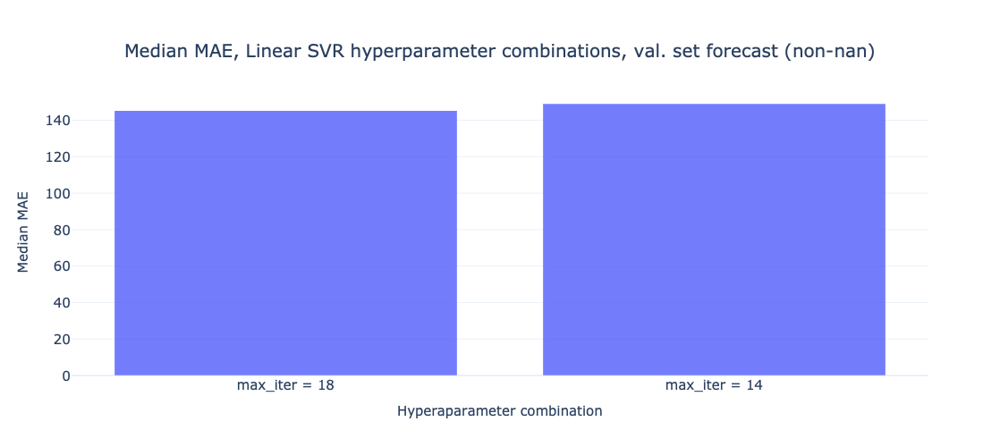

In [125]:
mae_list = []
if len(linearSVR_combo_list) > 2:
    for combo in range(len(linearSVR_combo_list) - 1):
        if linearSVR_combo_list[combo] == linearSVR_combo_list[combo + 1]:
            median_list = []
            for ele in range(len(linearSVR_max_iter_list[combo:])):
                for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['MAE'])):
                    median_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['MAE'])[item])
            mae_list.append(statistics.median((median_list)))
        else:
            if linearSVR_combo_list[combo] in linearSVR_combo_list[:combo]:
                match_list = []
                index_list = []
                for ele in range(len(linearSVR_combo_list[:combo + 1])):
                    if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo]:
                        for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MAE'])):
                            match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MAE'])[item])
                        index_list.append(ele)
                mae_list.append(statistics.median(match_list))
                for i in range(len(index_list)):
                    if mae_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                        mae_list.remove(mae_list[:combo][index_list[i]])
            else:
                if linearSVR_combo_list[combo + 1] in linearSVR_combo_list[:combo + 1]:
                    match_list = []
                    index_list = []
                    for ele in range(len(linearSVR_combo_list[:combo + 1])):
                        if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo + 1]:
                            for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MAE'])):
                                match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MAE'])[item])
                            index_list.append(ele)
                    mae_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if mae_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            mae_list.remove(mae_list[:combo][index_list[i]])
                else:
                    mae_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo]]['MAE']))
else:
    for combo in range(len(linearSVR_combo_list)):
        if combo == 0:
            if linearSVR_combo_list[combo] == linearSVR_combo_list[combo + 1]:
                median_list = []
                for ele in range(len(linearSVR_max_iter_list[combo:])):
                    for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['MAE'])):
                        median_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['MAE'])[item])
                mae_list.append(statistics.median((median_list)))
            else:
                if linearSVR_combo_list[combo] in linearSVR_combo_list[:combo]:
                    match_list = []
                    index_list = []
                    for ele in range(len(linearSVR_combo_list[:combo + 1])):
                        if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo]:
                            for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MAE'])):
                                match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MAE'])[item])
                            index_list.append(ele)
                    mae_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if mae_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            mae_list.remove(mae_list[:combo][index_list[i]])
                else:
                    if linearSVR_combo_list[combo + 1] in linearSVR_combo_list[:combo + 1]:
                        match_list = []
                        index_list = []
                        for ele in range(len(linearSVR_combo_list[:combo + 1])):
                            if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo + 1]:
                                for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MAE'])):
                                    match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MAE'])[item])
                                index_list.append(ele)
                        mae_list.append(statistics.median(match_list))
                        for i in range(len(index_list)):
                            if mae_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                                mae_list.remove(mae_list[:combo][index_list[i]])
                    else:
                        mae_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo]]['MAE']))
        if combo == 1:
            mae_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo]]['MAE']))
            
#Remove nans and deal with repeated combos (each combo score is an aggregation across combo instances
#so don't need repeats):
pop_list = []
pop_list_2 = []
combo_list = linearSVR_combo_list.copy()
for mae in range(len(mae_list)):
    if pd.isnull(mae_list[mae]):
        pop_list.append(mae)
loop_list_mae = mae_list.copy()
loop_list_svr = combo_list.copy()
if len(pop_list) > 1:
    for index in range(len(pop_list), -1, -1):
        mae_list.pop(mae_list.index(loop_list_mae[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_svr[pop_list[index]]))
else:
    for index in range(len(pop_list)):
        mae_list.pop(mae_list.index(loop_list_mae[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_svr[pop_list[index]]))
for combo in range(len(combo_list) - 1):
    if combo_list[combo] == combo_list[combo + 1]:
        pop_list_2.append(combo)
    else:
        if combo_list[combo] in combo_list[:combo]:
            pop_list_2.append(combo)
        else:
            if combo_list[combo + 1] in combo_list[:combo + 1]:
                pop_list_2.append(combo + 1)
loop_list_svr = combo_list.copy()
if len(pop_list_2) > 1:
    for index in range(len(pop_list_2), -1, -1):
        combo_list.pop(combo_list.index(loop_list_svr[pop_list_2[index]]))
else:
    for index in range(len(pop_list_2)):
        combo_list.pop(combo_list.index(loop_list_svr[pop_list_2[index]]))
d = {'Hyperaparameter combination': combo_list, 'Median MAE': mae_list}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Hyperaparameter combination",
    y = 'Median MAE',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median MAE, Linear SVR hyperparameter combinations, val. set forecast (non-nan)'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median MAE", xlabel='Hyperaparameter combination')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_mae_linear_svr_hyperparameter_combos_validation_set_forecast.png")
fig.show()

/tmp/ipykernel_15498/3682774674.py:37: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3682774674.py:7: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3682774674.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3682774674.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3682774674.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3682774674.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3682774674.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3682774674.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3682774674.py:8: UserWarning:

Boolean Series key 

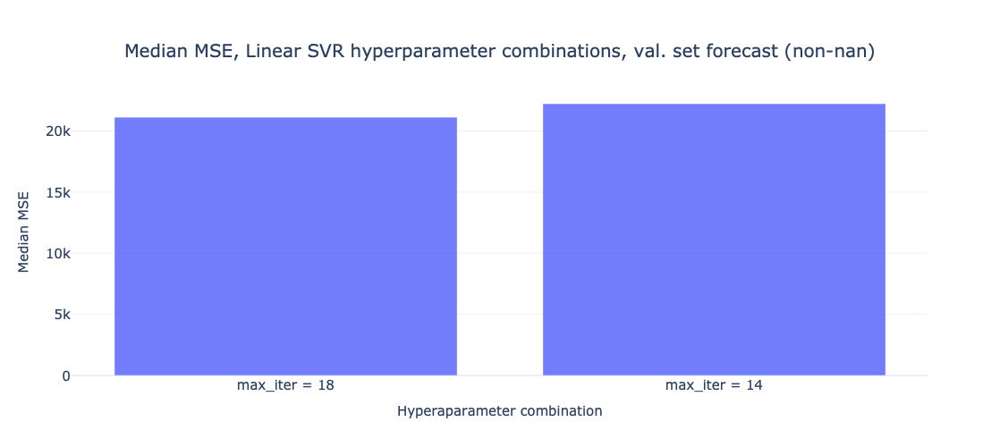

In [128]:
mse_list = []
if len(linearSVR_combo_list) > 2:
    for combo in range(len(linearSVR_combo_list) - 1):
        if linearSVR_combo_list[combo] == linearSVR_combo_list[combo + 1]:
            median_list = []
            for ele in range(len(linearSVR_max_iter_list[combo:])):
                for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['MSE'])):
                    median_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['MSE'])[item])
            mse_list.append(statistics.median((median_list)))
        else:
            if linearSVR_combo_list[combo] in linearSVR_combo_list[:combo]:
                match_list = []
                index_list = []
                for ele in range(len(linearSVR_combo_list[:combo + 1])):
                    if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo]:
                        for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MSE'])):
                            match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MSE'])[item])
                        index_list.append(ele)
                mse_list.append(statistics.median(match_list))
                for i in range(len(index_list)):
                    if mse_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                        mse_list.remove(mse_list[:combo][index_list[i]])
            else:
                if linearSVR_combo_list[combo + 1] in linearSVR_combo_list[:combo + 1]:
                    match_list = []
                    index_list = []
                    for ele in range(len(linearSVR_combo_list[:combo + 1])):
                        if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo + 1]:
                            for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MSE'])):
                                match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MSE'])[item])
                            index_list.append(ele)
                    mse_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if mse_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            mse_list.remove(mse_list[:combo][index_list[i]])
                else:
                    mse_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo]]['MSE']))
else:
    for combo in range(len(linearSVR_combo_list)):
        if combo == 0:
            if linearSVR_combo_list[combo] == linearSVR_combo_list[combo + 1]:
                median_list = []
                for ele in range(len(linearSVR_max_iter_list[combo:])):
                    for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['MSE'])):
                        median_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['MSE'])[item])
                mse_list.append(statistics.median((median_list)))
            else:
                if linearSVR_combo_list[combo] in linearSVR_combo_list[:combo]:
                    match_list = []
                    index_list = []
                    for ele in range(len(linearSVR_combo_list[:combo + 1])):
                        if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo]:
                            for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MSE'])):
                                match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MSE'])[item])
                            index_list.append(ele)
                    mse_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if mse_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            mse_list.remove(mse_list[:combo][index_list[i]])
                else:
                    if linearSVR_combo_list[combo + 1] in linearSVR_combo_list[:combo + 1]:
                        match_list = []
                        index_list = []
                        for ele in range(len(linearSVR_combo_list[:combo + 1])):
                            if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo + 1]:
                                for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MSE'])):
                                    match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MSE'])[item])
                                index_list.append(ele)
                        mse_list.append(statistics.median(match_list))
                        for i in range(len(index_list)):
                            if mse_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                                mse_list.remove(mse_list[:combo][index_list[i]])
                    else:
                        mse_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo]]['MSE']))  
        if combo == 1:
            mse_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo]]['MSE'])) 

#Remove nans and deal with repeated combos (each combo score is an aggregation across combo instances
#so don't need repeats):
pop_list = []
pop_list_2 = []
combo_list = linearSVR_combo_list.copy()
for mse in range(len(mse_list)):
    if pd.isnull(mse_list[mse]):
        pop_list.append(mse)
loop_list_mse = mse_list.copy()
loop_list_svr = combo_list.copy()
if len(pop_list) > 1:
    for index in range(len(pop_list), -1, -1):
        mse_list.pop(mse_list.index(loop_list_mse[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_svr[pop_list[index]]))
else:
    for index in range(len(pop_list)):
        mse_list.pop(mse_list.index(loop_list_mse[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_svr[pop_list[index]]))
for combo in range(len(combo_list) - 1):
    if combo_list[combo] == combo_list[combo + 1]:
        pop_list_2.append(combo)
    else:
        if combo_list[combo] in combo_list[:combo]:
            pop_list_2.append(combo)
        else:
            if combo_list[combo + 1] in combo_list[:combo + 1]:
                pop_list_2.append(combo + 1)
loop_list_svr = combo_list.copy()
if len(pop_list_2) > 1:
    for index in range(len(pop_list_2), -1, -1):
        combo_list.pop(combo_list.index(loop_list_svr[pop_list_2[index]]))
else:
    for index in range(len(pop_list_2)):
        combo_list.pop(combo_list.index(loop_list_svr[pop_list_2[index]]))

d = {'Hyperaparameter combination': combo_list, 'Median MSE': mse_list}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Hyperaparameter combination",
    y = 'Median MSE',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median MSE, Linear SVR hyperparameter combinations, val. set forecast (non-nan)'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median MSE", xlabel='Hyperaparameter combination')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_mse_linear_svr_hyperparameter_combos_validation_set_forecast.png")
fig.show()

/tmp/ipykernel_15498/84005806.py:37: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/84005806.py:7: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/84005806.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/84005806.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/84005806.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/84005806.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/84005806.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/84005806.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/84005806.py:8: UserWarning:

Boolean Series key will be reindexed 

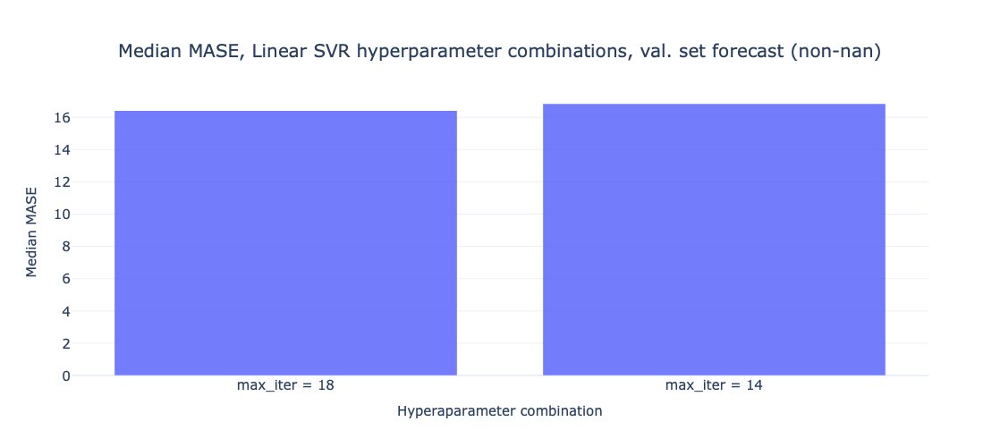

In [137]:
mase_list = []
if len(linearSVR_combo_list) > 2:
    for combo in range(len(linearSVR_combo_list) - 1):
        if linearSVR_combo_list[combo] == linearSVR_combo_list[combo + 1]:
            median_list = []
            for ele in range(len(linearSVR_max_iter_list[combo:])):
                for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['MASE'])):
                    median_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['MASE'])[item])
            mase_list.append(statistics.median((median_list)))
        else:
            if linearSVR_combo_list[combo] in linearSVR_combo_list[:combo]:
                match_list = []
                index_list = []
                for ele in range(len(linearSVR_combo_list[:combo + 1])):
                    if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo]:
                        for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MASE'])):
                            match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MASE'])[item])
                        index_list.append(ele)
                mase_list.append(statistics.median(match_list))
                for i in range(len(index_list)):
                    if mase_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                        mase_list.remove(mase_list[:combo][index_list[i]])
            else:
                if linearSVR_combo_list[combo + 1] in linearSVR_combo_list[:combo + 1]:
                    match_list = []
                    index_list = []
                    for ele in range(len(linearSVR_combo_list[:combo + 1])):
                        if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo + 1]:
                            for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MASE'])):
                                match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MASE'])[item])
                            index_list.append(ele)
                    mase_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if mase_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            mase_list.remove(mse_list[:combo][index_list[i]])
                else:
                    mase_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo]]['MASE']))            
else:
    for combo in range(len(linearSVR_combo_list)):
        if combo == 0:
            if linearSVR_combo_list[combo] == linearSVR_combo_list[combo + 1]:
                median_list = []
                for ele in range(len(linearSVR_max_iter_list[combo:])):
                    for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['MASE'])):
                        median_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['MASE'])[item])
                mase_list.append(statistics.median((median_list)))
            else:
                if linearSVR_combo_list[combo] in linearSVR_combo_list[:combo]:
                    match_list = []
                    index_list = []
                    for ele in range(len(linearSVR_combo_list[:combo + 1])):
                        if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo]:
                            for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MASE'])):
                                match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MASE'])[item])
                            index_list.append(ele)
                    mase_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if mase_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            mase_list.remove(mase_list[:combo][index_list[i]])
                else:
                    if linearSVR_combo_list[combo + 1] in linearSVR_combo_list[:combo + 1]:
                        match_list = []
                        index_list = []
                        for ele in range(len(linearSVR_combo_list[:combo + 1])):
                            if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo + 1]:
                                for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MASE'])):
                                    match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['MASE'])[item])
                                index_list.append(ele)
                        mase_list.append(statistics.median(match_list))
                        for i in range(len(index_list)):
                            if mase_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                                mase_list.remove(mase_list[:combo][index_list[i]])
                    else:
                        mase_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo]]['MASE']))
        if combo == 1:
            mase_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo]]['MASE']))
            
#Remove nans and deal with repeated combos (each combo score is an aggregation across combo instances
#so don't need repeats):
pop_list = []
pop_list_2 = []
combo_list = linearSVR_combo_list.copy()
for mase in range(len(mase_list)):
    if pd.isnull(mase_list[mase]):
        pop_list.append(mase)
loop_list_mase = mase_list.copy()
loop_list_svr = combo_list.copy()
if len(pop_list) > 1:
    for index in range(len(pop_list), -1, -1):
        mase_list.pop(mase_list.index(loop_list_mase[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_svr[pop_list[index]]))
else:
    for index in range(len(pop_list)):
        mase_list.pop(mase_list.index(loop_list_mase[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_svr[pop_list[index]]))
for combo in range(len(combo_list) - 1):
    if combo_list[combo] == combo_list[combo + 1]:
        pop_list_2.append(combo)
    else:
        if combo_list[combo] in combo_list[:combo]:
            pop_list_2.append(combo)
        else:
            if combo_list[combo + 1] in combo_list[:combo + 1]:
                pop_list_2.append(combo + 1)
loop_list_svr = combo_list.copy()
if len(pop_list_2) > 1:
    for index in range(len(pop_list_2), -1, -1):
        combo_list.pop(combo_list.index(loop_list_svr[pop_list_2[index]]))
else:
    for index in range(len(pop_list_2)):
        combo_list.pop(combo_list.index(loop_list_svr[pop_list_2[index]]))

d = {'Hyperaparameter combination': combo_list, 'Median MASE': mase_list}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Hyperaparameter combination",
    y = 'Median MASE',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median MASE, Linear SVR hyperparameter combinations, val. set forecast (non-nan)'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median MASE", xlabel='Hyperaparameter combination')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_mase_linear_svr_hyperparameter_combos_validation_set_forecast.png")
fig.show()

/tmp/ipykernel_15498/3278556767.py:37: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3278556767.py:7: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3278556767.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3278556767.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3278556767.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3278556767.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3278556767.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3278556767.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/3278556767.py:8: UserWarning:

Boolean Series key 

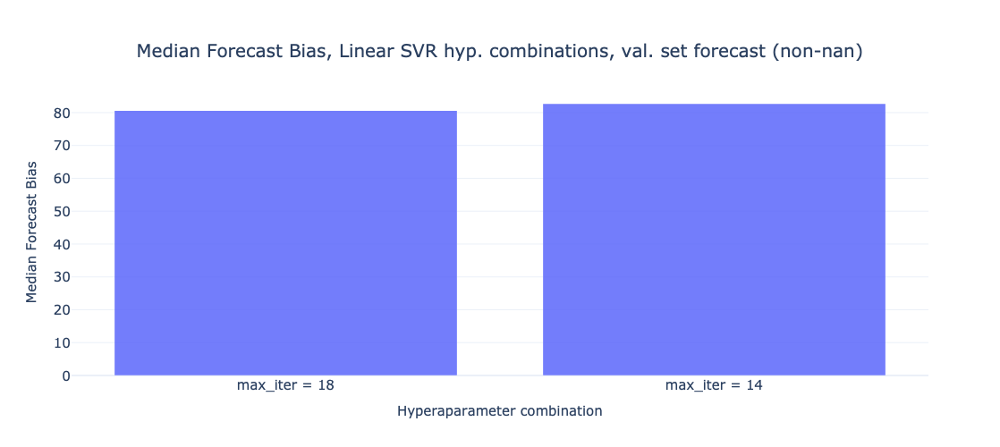

In [138]:
fbias_list = []
if len(linearSVR_combo_list) > 2:
    for combo in range(len(linearSVR_combo_list) - 1):
        if linearSVR_combo_list[combo] == linearSVR_combo_list[combo + 1]:
            median_list = []
            for ele in range(len(linearSVR_max_iter_list[combo:])):
                for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['Forecast Bias'])):
                    median_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['Forecast Bias'])[item])
            fbias_list.append(statistics.median((median_list)))
        else:
            if linearSVR_combo_list[combo] in linearSVR_combo_list[:combo]:
                match_list = []
                index_list = []
                for ele in range(len(linearSVR_combo_list[:combo + 1])):
                    if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo]:
                        for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['Forecast Bias'])):
                            match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['Forecast Bias'])[item])
                        index_list.append(ele)
                fbias_list.append(statistics.median(match_list))
                for i in range(len(index_list)):
                    if fbias_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                        fbias_list.remove(fbias_list[:combo][index_list[i]])
            else:
                if linearSVR_combo_list[combo + 1] in linearSVR_combo_list[:combo + 1]:
                    match_list = []
                    index_list = []
                    for ele in range(len(linearSVR_combo_list[:combo + 1])):
                        if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo + 1]:
                            for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['Forecast Bias'])):
                                match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['Forecast Bias'])[item])
                            index_list.append(ele)
                    fbias_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if fbias_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            fbias_list.remove(mse_list[:combo][index_list[i]])              
                else:
                    fbias_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo]]['Forecast Bias']))
else:
    for combo in range(len(linearSVR_combo_list)):
        if combo == 0:
            if linearSVR_combo_list[combo] == linearSVR_combo_list[combo + 1]:
                median_list = []
                for ele in range(len(linearSVR_max_iter_list[combo:])):
                    for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['Forecast Bias'])):
                        median_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo + ele]]['Forecast Bias'])[item])
                fbias_list.append(statistics.median((median_list)))
            else:
                if linearSVR_combo_list[combo] in linearSVR_combo_list[:combo]:
                    match_list = []
                    index_list = []
                    for ele in range(len(linearSVR_combo_list[:combo + 1])):
                        if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo]:
                            for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['Forecast Bias'])):
                                match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['Forecast Bias'])[item])
                            index_list.append(ele)
                    fbias_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if fbias_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            fbias_list.remove(fbias_list[:combo][index_list[i]])
                else:
                    if linearSVR_combo_list[combo + 1] in linearSVR_combo_list[:combo + 1]:
                        match_list = []
                        index_list = []
                        for ele in range(len(linearSVR_combo_list[:combo + 1])):
                            if linearSVR_combo_list[:combo + 1][ele] == linearSVR_combo_list[combo + 1]:
                                for item in range(len(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['Forecast Bias'])):
                                    match_list.append(list(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[linearSVR_combo_list.index(linearSVR_combo_list[:combo + 1][ele])]]['Forecast Bias'])[item])
                                index_list.append(ele)
                        fbias_list.append(statistics.median(match_list))
                        for i in range(len(index_list)):
                            if fbias_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                                fbias_list.remove(fbias_list[:combo][index_list[i]])      
                    else:
                        fbias_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo]]['Forecast Bias']))
        if combo == 1:
            fbias_list.append(statistics.median(metric_df[metric_df['Linear SVR'] == 1][metric_df['max iter'] == linearSVR_max_iter_list[combo]]['Forecast Bias']))

#Remove nans and deal with repeated combos (each combo score is an aggregation across combo instances
#so don't need repeats):
pop_list = []
pop_list_2 = []
combo_list = linearSVR_combo_list.copy()
for fbias in range(len(fbias_list)):
    if pd.isnull(fbias_list[fbias]):
        pop_list.append(fbias)
loop_list_fbias = fbias_list.copy()
loop_list_svr = combo_list.copy()
if len(pop_list) > 1:
    for index in range(len(pop_list), -1, -1):
        fbias_list.pop(fbias_list.index(loop_list_fbias[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_svr[pop_list[index]]))
else:
    for index in range(len(pop_list)):
        fbias_list.pop(fbias_list.index(loop_list_fbias[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_svr[pop_list[index]]))
for combo in range(len(combo_list) - 1):
    if combo_list[combo] == combo_list[combo + 1]:
        pop_list_2.append(combo)
    else:
        if combo_list[combo] in combo_list[:combo]:
            pop_list_2.append(combo)
        else:
            if combo_list[combo + 1] in combo_list[:combo + 1]:
                pop_list_2.append(combo + 1)
loop_list_svr = combo_list.copy()
if len(pop_list_2) > 1:
    for index in range(len(pop_list_2), -1, -1):
        combo_list.pop(combo_list.index(loop_list_svr[pop_list_2[index]]))
else:
    for index in range(len(pop_list_2)):
        combo_list.pop(combo_list.index(loop_list_svr[pop_list_2[index]]))

d = {'Hyperaparameter combination': combo_list, 'Median Forecast Bias': fbias_list}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Hyperaparameter combination",
    y = 'Median Forecast Bias',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median Forecast Bias, Linear SVR hyp. combinations, val. set forecast (non-nan)'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median Forecast Bias", xlabel='Hyperaparameter combination')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_fbias_linear_svr_hyperparameter_combos_validation_set_forecast.png")
fig.show()

XGBoost:

/tmp/ipykernel_15498/4124343943.py:76: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/4124343943.py:76: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/4124343943.py:78: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_15498/4124343943.py:78: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



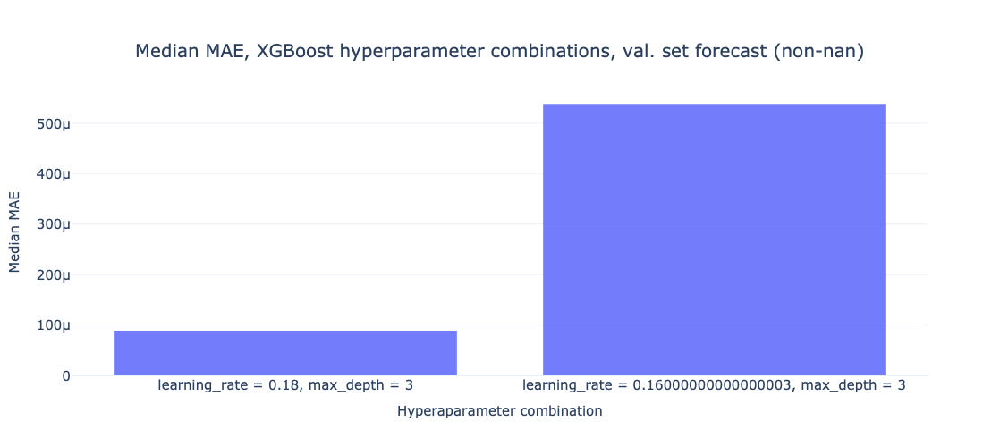

Median MAE 8.914345190042265e-05
Median MAE 0.0005387155633109998


In [141]:
mae_list = []

if len(XGB_combo_list) > 2:
    for combo in range(len(XGB_combo_list) - 1):
        if XGB_combo_list[combo] == XGB_combo_list[combo + 1]:
            median_list = []
            for ele in range(len(XGB_max_depth_list[combo:])):
                for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['MAE'])):
                    median_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['MAE'])[item])
            mae_list.append(statistics.median((median_list)))
        else:
            if XGB_combo_list[combo] in XGB_combo_list[:combo]:
                match_list = []
                index_list = []
                for ele in range(len(XGB_combo_list[:combo + 1])):
                    if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo]:
                        for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MAE'])):
                            match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MAE'])[item])
                        index_list.append(ele)
                mae_list.append(statistics.median(match_list))
                for i in range(len(index_list)):
                    if mae_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                        mae_list.remove(mae_list[:combo][index_list[i]])
            else:
                if XGB_combo_list[combo + 1] in XGB_combo_list[:combo + 1]:
                    match_list = []
                    index_list = []
                    for ele in range(len(XGB_combo_list[:combo + 1])):
                        if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo + 1]:
                            for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MAE'])):
                                match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MAE'])[item])
                            index_list.append(ele)
                    mae_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if mae_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            mae_list.remove(mae_list[:combo][index_list[i]])                  
                else:
                    mae_list.append(statistics.median(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo]][metric_df['learning rate'] == XGB_learning_rate_list[combo]]['MAE']))
else:
    for combo in range(len(XGB_combo_list)):
        if combo == 0:
            if XGB_combo_list[combo] == XGB_combo_list[combo + 1]:
                median_list = []
                for ele in range(len(XGB_max_depth_list[combo:])):
                    for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['MAE'])):
                        median_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['MAE'])[item])
                mae_list.append(statistics.median((median_list)))
            else:
                if XGB_combo_list[combo] in XGB_combo_list[:combo]:
                    match_list = []
                    index_list = []
                    for ele in range(len(dtree_combo_list[:combo + 1])):
                        if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo]:
                            for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MAE'])):
                                match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MAE'])[item])
                            index_list.append(ele)
                    mae_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if mae_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            mae_list.remove(mae_list[:combo][index_list[i]])
                else:
                    if XGB_combo_list[combo + 1] in XGB_combo_list[:combo + 1]:
                        match_list = []
                        index_list = []
                        for ele in range(len(XGB_combo_list[:combo + 1])):
                            if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo + 1]:
                                for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MAE'])):
                                    match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MAE'])[item])
                                index_list.append(ele)
                        mae_list.append(statistics.median(match_list))
                        for i in range(len(index_list)):
                            if mae_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                                mae_list.remove(mae_list[:combo][index_list[i]])                  
                    else:
                        mae_list.append(statistics.median(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo]][metric_df['learning rate'] == XGB_learning_rate_list[combo]]['MAE']))
        if combo == 1:
           mae_list.append(statistics.median(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo]][metric_df['learning rate'] == XGB_learning_rate_list[combo]]['MAE']))
                
#Remove nans and deal with repeated combos (each combo score is an aggregation across combo instances
#so don't need repeats):
pop_list = []
pop_list_2 = []
combo_list = XGB_combo_list.copy()
for mae in range(len(mae_list)):
    if pd.isnull(mae_list[mae]):
        pop_list.append(mae)
loop_list_mae = mae_list.copy()
loop_list_xgb = combo_list.copy()
if len(pop_list) > 1:
    for index in range(len(pop_list), -1, -1):
        mae_list.pop(mae_list.index(loop_list_mae[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list[index]]))
else:
    for index in range(len(pop_list)):
        mae_list.pop(mae_list.index(loop_list_mae[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list[index]]))
for combo in range(len(combo_list) - 1):
    if combo_list[combo] == combo_list[combo + 1]:
        pop_list_2.append(combo)
    else:
        if combo_list[combo] in combo_list[:combo]:
            pop_list_2.append(combo)
        else:
            if combo_list[combo + 1] in combo_list[:combo + 1]:
                pop_list_2.append(combo + 1)
loop_list_xgb = combo_list.copy()
if len(pop_list_2) > 1:
    for index in range(len(pop_list_2), -1, -1):
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list_2[index]]))
else:
    for index in range(len(pop_list_2)):
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list_2[index]]))
d = {'Hyperaparameter combination': combo_list, 'Median MAE': mae_list}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Hyperaparameter combination",
    y = 'Median MAE',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median MAE, XGBoost hyperparameter combinations, val. set forecast (non-nan)'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median MAE", xlabel='Hyperaparameter combination')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_mae_XGB_hyperparameter_combos_validation_set_forecast.png")
fig.show()
print('Median MAE', mae_list[0])
print('Median MAE', mae_list[1])

/tmp/ipykernel_28245/1075672099.py:75: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_28245/1075672099.py:75: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_28245/1075672099.py:77: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_28245/1075672099.py:77: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



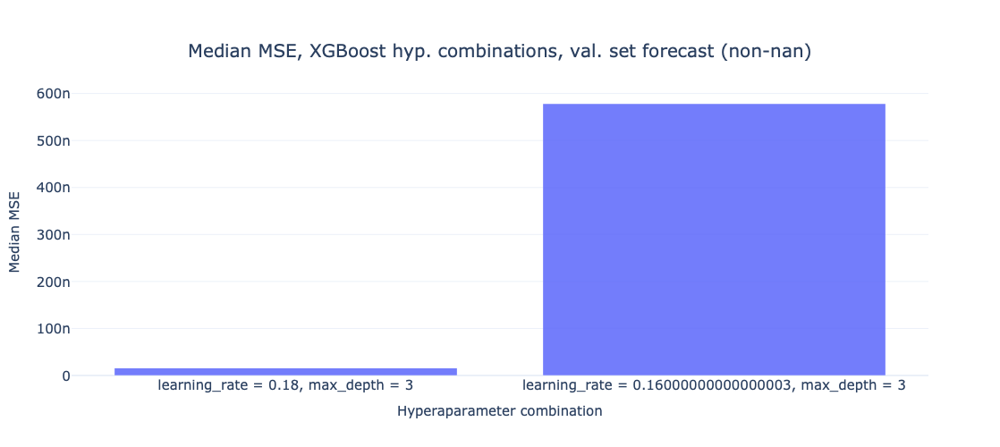

Median MSE 1.6199620931104416e-08
Median MSE 5.783091642232175e-07


In [23]:
mse_list = []

if len(XGB_combo_list) > 2:
    for combo in range(len(XGB_combo_list) - 1):
        if XGB_combo_list[combo] == XGB_combo_list[combo + 1]:
            median_list = []
            for ele in range(len(XGB_max_depth_list[combo:])):
                for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['MSE'])):
                    median_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['MSE'])[item])
            mse_list.append(statistics.median((median_list)))
        else:
            if XGB_combo_list[combo] in XGB_combo_list[:combo]:
                match_list = []
                index_list = []
                for ele in range(len(XGB_combo_list[:combo + 1])):
                    if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo]:
                        for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MSE'])):
                            match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MSE'])[item])
                        index_list.append(ele)
                mse_list.append(statistics.median(match_list))
                for i in range(len(index_list)):
                    if mse_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                        mse_list.remove(mse_list[:combo][index_list[i]])
            else:
                if XGB_combo_list[combo + 1] in XGB_combo_list[:combo + 1]:
                    match_list = []
                    index_list = []
                    for ele in range(len(XGB_combo_list[:combo + 1])):
                        if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo + 1]:
                            for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MSE'])):
                                match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MSE'])[item])
                            index_list.append(ele)
                    mse_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if mse_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            mse_list.remove(mse_list[:combo][index_list[i]])                  
                else:
                    mse_list.append(statistics.median(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo]][metric_df['learning rate'] == XGB_learning_rate_list[combo]]['MSE']))
else:
    for combo in range(len(XGB_combo_list)):
        if combo == 0:
            if XGB_combo_list[combo] == XGB_combo_list[combo + 1]:
                median_list = []
                for ele in range(len(XGB_max_depth_list[combo:])):
                    for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['MSE'])):
                        median_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['MSE'])[item])
                mse_list.append(statistics.median((median_list)))
            else:
                if XGB_combo_list[combo] in XGB_combo_list[:combo]:
                    match_list = []
                    index_list = []
                    for ele in range(len(dtree_combo_list[:combo + 1])):
                        if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo]:
                            for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MSE'])):
                                match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MSE'])[item])
                            index_list.append(ele)
                    mse_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if mse_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            mse_list.remove(mse_list[:combo][index_list[i]])
                else:
                    if XGB_combo_list[combo + 1] in XGB_combo_list[:combo + 1]:
                        match_list = []
                        index_list = []
                        for ele in range(len(XGB_combo_list[:combo + 1])):
                            if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo + 1]:
                                for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MSE'])):
                                    match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MSE'])[item])
                                index_list.append(ele)
                        mse_list.append(statistics.median(match_list))
                        for i in range(len(index_list)):
                            if mse_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                                mse_list.remove(mse_list[:combo][index_list[i]])                  
                    else:
                        mse_list.append(statistics.median(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo]][metric_df['learning rate'] == XGB_learning_rate_list[combo]]['MSE']))
        if combo == 1:
           mse_list.append(statistics.median(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo]][metric_df['learning rate'] == XGB_learning_rate_list[combo]]['MSE']))
            
#Remove nans and deal with repeated combos (each combo score is an aggregation across combo instances 
#so don't need repeats):
pop_list = []
pop_list_2 = []
combo_list = XGB_combo_list.copy()
for mse in range(len(mse_list)):
    if pd.isnull(mse_list[mse]):
        pop_list.append(mse)
loop_list_mse = mse_list.copy()
loop_list_xgb = combo_list.copy()
if len(pop_list) > 1:
    for index in range(len(pop_list), -1, -1):
        mse_list.pop(mse_list.index(loop_list_mse[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list[index]]))
else:
    for index in range(len(pop_list)):
        mse_list.pop(mse_list.index(loop_list_mse[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list[index]]))
for combo in range(len(combo_list) - 1):
    if combo_list[combo] == combo_list[combo + 1]:
        pop_list_2.append(combo)
    else:
        if combo_list[combo] in combo_list[:combo]:
            pop_list_2.append(combo)
        else:
            if combo_list[combo + 1] in combo_list[:combo + 1]:
                pop_list_2.append(combo + 1)
loop_list_xgb = combo_list.copy()
if len(pop_list_2) > 1:
    for index in range(len(pop_list_2), -1, -1):
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list_2[index]]))
else:
    for index in range(len(pop_list_2)):
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list_2[index]]))
    
d = {'Hyperaparameter combination': combo_list, 'Median MSE': mse_list}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Hyperaparameter combination",
    y = 'Median MSE',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median MSE, XGBoost hyp. combinations, val. set forecast (non-nan)'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median MSE", xlabel='Hyperaparameter combination')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_mse_xgb_hyperparameter_combos_validation_set_forecast.png")
fig.show()
print('Median MSE', mse_list[0])
print('Median MSE', mse_list[1])

/tmp/ipykernel_28245/1350923705.py:75: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_28245/1350923705.py:75: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_28245/1350923705.py:77: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_28245/1350923705.py:77: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



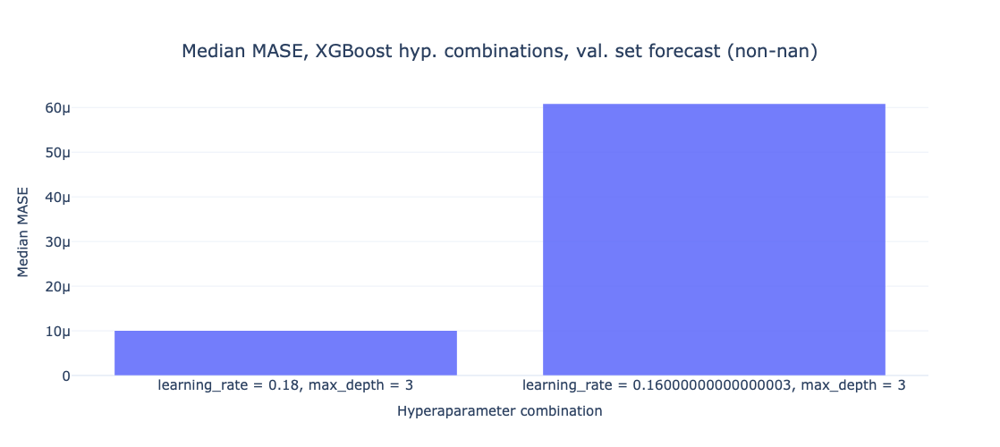

Median MASE 1.0069685674761594e-05
Median MASE 6.085355990817512e-05


In [25]:
mase_list = []

if len(XGB_combo_list) > 2:
    for combo in range(len(XGB_combo_list) - 1):
        if XGB_combo_list[combo] == XGB_combo_list[combo + 1]:
            median_list = []
            for ele in range(len(XGB_max_depth_list[combo:])):
                for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['MASE'])):
                    median_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['MASE'])[item])
            mase_list.append(statistics.median((median_list)))
        else:
            if XGB_combo_list[combo] in XGB_combo_list[:combo]:
                match_list = []
                index_list = []
                for ele in range(len(XGB_combo_list[:combo + 1])):
                    if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo]:
                        for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MASE'])):
                            match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MASE'])[item])
                        index_list.append(ele)
                mase_list.append(statistics.median(match_list))
                for i in range(len(index_list)):
                    if mase_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                        mase_list.remove(mase_list[:combo][index_list[i]])
            else:
                if XGB_combo_list[combo + 1] in XGB_combo_list[:combo + 1]:
                    match_list = []
                    index_list = []
                    for ele in range(len(XGB_combo_list[:combo + 1])):
                        if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo + 1]:
                            for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MASE'])):
                                match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MASE'])[item])
                            index_list.append(ele)
                    mase_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if mase_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            mase_list.remove(mase_list[:combo][index_list[i]])                  
                else:
                    mase_list.append(statistics.median(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo]][metric_df['learning rate'] == XGB_learning_rate_list[combo]]['MASE']))
else:
    for combo in range(len(XGB_combo_list)):
        if combo == 0:
            if XGB_combo_list[combo] == XGB_combo_list[combo + 1]:
                median_list = []
                for ele in range(len(XGB_max_depth_list[combo:])):
                    for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['MASE'])):
                        median_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['MASE'])[item])
                mase_list.append(statistics.median((median_list)))
            else:
                if XGB_combo_list[combo] in XGB_combo_list[:combo]:
                    match_list = []
                    index_list = []
                    for ele in range(len(dtree_combo_list[:combo + 1])):
                        if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo]:
                            for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MASE'])):
                                match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MASE'])[item])
                            index_list.append(ele)
                    mase_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if mase_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            mase_list.remove(mase_list[:combo][index_list[i]])
                else:
                    if XGB_combo_list[combo + 1] in XGB_combo_list[:combo + 1]:
                        match_list = []
                        index_list = []
                        for ele in range(len(XGB_combo_list[:combo + 1])):
                            if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo + 1]:
                                for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MASE'])):
                                    match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['MASE'])[item])
                                index_list.append(ele)
                        mase_list.append(statistics.median(match_list))
                        for i in range(len(index_list)):
                            if mase_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                                mase_list.remove(mase_list[:combo][index_list[i]])                  
                    else:
                        mase_list.append(statistics.median(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo]][metric_df['learning rate'] == XGB_learning_rate_list[combo]]['MASE']))
        if combo == 1:
           mase_list.append(statistics.median(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo]][metric_df['learning rate'] == XGB_learning_rate_list[combo]]['MASE']))
            
#Remove nans and deal with repeated combos (each combo score is an aggregation across combo instances
#so don't need repeats):
pop_list = []
pop_list_2 = []
combo_list = XGB_combo_list.copy()
for mase in range(len(mase_list)):
    if pd.isnull(mase_list[mase]):
        pop_list.append(mase)
loop_list_mase = mase_list.copy()
loop_list_xgb = combo_list.copy()
if len(pop_list) > 1:
    for index in range(len(pop_list), -1, -1):
        mase_list.pop(mase_list.index(loop_list_mase[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list[index]]))
else:
    for index in range(len(pop_list)):
        mase_list.pop(mase_list.index(loop_list_mase[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list[index]]))
for combo in range(len(combo_list) - 1):
    if combo_list[combo] == combo_list[combo + 1]:
        pop_list_2.append(combo)
    else:
        if combo_list[combo] in combo_list[:combo]:
            pop_list_2.append(combo)
        else:
            if combo_list[combo + 1] in combo_list[:combo + 1]:
                pop_list_2.append(combo + 1)
loop_list_xgb = combo_list.copy()
if len(pop_list_2) > 1:
    for index in range(len(pop_list_2), -1, -1):
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list_2[index]]))
else:
    for index in range(len(pop_list_2)):
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list_2[index]]))

d = {'Hyperaparameter combination': combo_list, 'Median MASE': mase_list}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Hyperaparameter combination",
    y = 'Median MASE',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median MASE, XGBoost hyp. combinations, val. set forecast (non-nan)'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median MASE", xlabel='Hyperaparameter combination')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_mase_xgb_hyperparameter_combos_validation_set_forecast.png")
fig.show()
print('Median MASE', mase_list[0])
print('Median MASE', mase_list[1])

/tmp/ipykernel_28245/1566736639.py:75: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_28245/1566736639.py:75: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_28245/1566736639.py:77: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_28245/1566736639.py:77: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



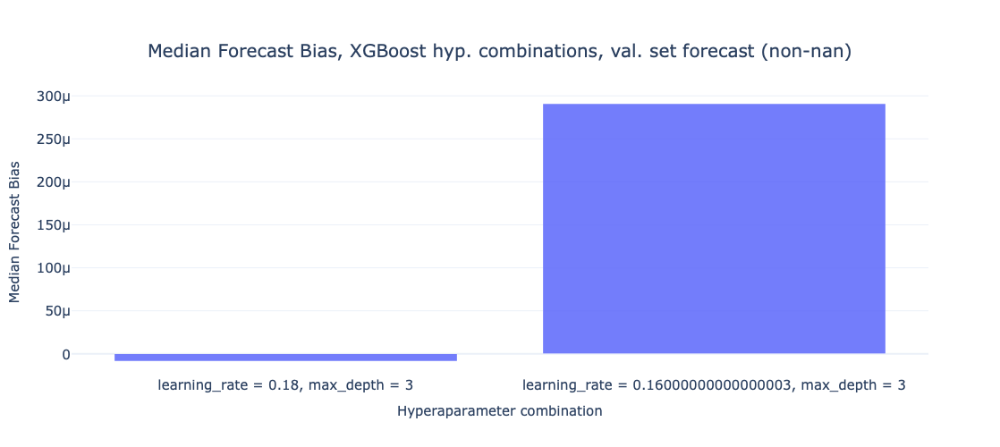

Median Forecast Bias -8.553863356511399e-06
Median Forecast Bias 0.0002908313533778563


In [26]:
fbias_list = []

if len(XGB_combo_list) > 2:
    for combo in range(len(XGB_combo_list) - 1):
        if XGB_combo_list[combo] == XGB_combo_list[combo + 1]:
            median_list = []
            for ele in range(len(XGB_max_depth_list[combo:])):
                for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['Forecast Bias'])):
                    median_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['Forecast Bias'])[item])
            fbias_list.append(statistics.median((median_list)))
        else:
            if XGB_combo_list[combo] in XGB_combo_list[:combo]:
                match_list = []
                index_list = []
                for ele in range(len(XGB_combo_list[:combo + 1])):
                    if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo]:
                        for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['Forecast Bias'])):
                            match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['Forecast Bias'])[item])
                        index_list.append(ele)
                fbias_list.append(statistics.median(match_list))
                for i in range(len(index_list)):
                    if fbias_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                        fbias_list.remove(fbias_list[:combo][index_list[i]])
            else:
                if XGB_combo_list[combo + 1] in XGB_combo_list[:combo + 1]:
                    match_list = []
                    index_list = []
                    for ele in range(len(XGB_combo_list[:combo + 1])):
                        if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo + 1]:
                            for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['Forecast Bias'])):
                                match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['Forecast Bias'])[item])
                            index_list.append(ele)
                    fbias_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if fbias_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            fbias_list.remove(fbias_list[:combo][index_list[i]])                  
                else:
                    fbias_list.append(statistics.median(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo]][metric_df['learning rate'] == XGB_learning_rate_list[combo]]['Forecast Bias']))
else:
    for combo in range(len(XGB_combo_list)):
        if combo == 0:
            if XGB_combo_list[combo] == XGB_combo_list[combo + 1]:
                median_list = []
                for ele in range(len(XGB_max_depth_list[combo:])):
                    for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['Forecast Bias'])):
                        median_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo + ele]][metric_df['learning rate'] == XGB_learning_rate_list[combo + ele]]['Forecast Bias'])[item])
                fbias_list.append(statistics.median((median_list)))
            else:
                if XGB_combo_list[combo] in XGB_combo_list[:combo]:
                    match_list = []
                    index_list = []
                    for ele in range(len(dtree_combo_list[:combo + 1])):
                        if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo]:
                            for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['Forecast Bias'])):
                                match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['Forecast Bias'])[item])
                            index_list.append(ele)
                    fbias_list.append(statistics.median(match_list))
                    for i in range(len(index_list)):
                        if fbias_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                            fbias_list.remove(fbias_list[:combo][index_list[i]])
                else:
                    if XGB_combo_list[combo + 1] in XGB_combo_list[:combo + 1]:
                        match_list = []
                        index_list = []
                        for ele in range(len(XGB_combo_list[:combo + 1])):
                            if XGB_combo_list[:combo + 1][ele] == XGB_combo_list[combo + 1]:
                                for item in range(len(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['Forecast Bias'])):
                                    match_list.append(list(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]][metric_df['learning rate'] == XGB_learning_rate_list[XGB_combo_list.index(XGB_combo_list[:combo + 1][ele])]]['Forecast Bias'])[item])
                                index_list.append(ele)
                        fbias_list.append(statistics.median(match_list))
                        for i in range(len(index_list)):
                            if fbias_list[:combo + 1][index_list[i]] != statistics.median(match_list):
                                fbias_list.remove(fbias_list[:combo][index_list[i]])                  
                    else:
                        fbias_list.append(statistics.median(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo]][metric_df['learning rate'] == XGB_learning_rate_list[combo]]['Forecast Bias']))
        if combo == 1:
           fbias_list.append(statistics.median(metric_df[metric_df['XGB'] == 1][metric_df['max depth'] == XGB_max_depth_list[combo]][metric_df['learning rate'] == XGB_learning_rate_list[combo]]['Forecast Bias']))
            
#Remove nans and deal with repeated combos (each combo score is an aggregation across combo instances
#so don't need repeats):
pop_list = []
pop_list_2 = []
combo_list = XGB_combo_list.copy()
for fbias in range(len(fbias_list)):
    if pd.isnull(fbias_list[fbias]):
        pop_list.append(fbias)
loop_list_fbias = mase_list.copy()
loop_list_xgb = combo_list.copy()
if len(pop_list) > 1:
    for index in range(len(pop_list), -1, -1):
        fbias_list.pop(fbias_list.index(loop_list_fbias[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list[index]]))
else:
    for index in range(len(pop_list)):
        fbias_list.pop(mse_list.index(loop_list_fbias[pop_list[index]]))
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list[index]]))
for combo in range(len(combo_list) - 1):
    if combo_list[combo] == combo_list[combo + 1]:
        pop_list_2.append(combo)
    else:
        if combo_list[combo] in combo_list[:combo]:
            pop_list_2.append(combo)
        else:
            if combo_list[combo + 1] in combo_list[:combo + 1]:
                pop_list_2.append(combo + 1)
loop_list_xgb = combo_list.copy()
if len(pop_list_2) > 1:
    for index in range(len(pop_list_2), -1, -1):
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list_2[index]]))
else:
    for index in range(len(pop_list_2)):
        combo_list.pop(combo_list.index(loop_list_xgb[pop_list_2[index]]))


d = {'Hyperaparameter combination': combo_list, 'Median Forecast Bias': fbias_list}
df = pd.DataFrame(data=d)
fig = px.bar(
    data_frame = df,
    x = "Hyperaparameter combination",
    y = 'Median Forecast Bias',
    opacity = 0.9,
    orientation = "v",
    barmode = 'relative',
    title='Median Forecast Bias, XGBoost hyp. combinations, val. set forecast (non-nan)'
)
#https://stackoverflow.com/questions/69978250/how-to-make-a-plotly-grouped-bar-chart-using-two-different-columns-from-spreadsh
#Accessed 10/07/2024
fig = format_plot(fig, ylabel="Median Forecast Bias", xlabel='Hyperaparameter combination')
fig.update_layout(legend=dict(
                font=dict(size=15),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                # title_text=ylabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ),
            xaxis=dict(
                # title_text=xlabel,
                titlefont=dict(size=15),
                tickfont=dict(size=15),
            ))
#^https://github.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/blob/main/notebooks/Chapter03/01-Visualizing%20Time%20Series.ipynb
#Accessed 06/06/2024 
fig.write_image("/Users/harrybakhshi/Desktop/Python_notes/data/PCDA_capstone/ml_validation/median_xgb_hyperparameter_combos_validation_set_forecast.png")
fig.show()
print('Median Forecast Bias', fbias_list[0])
print('Median Forecast Bias', fbias_list[1])

- Non-nan hyperparameter combinations for Linear SVR very similar in all metrics, all metrics better for XGBoost combination max_depth = 3, learning_rate = 0.18 

# Conclusions:

- Decision Tree (best) and Random Forest best models by all metrics for validation set
- Linear Regression, Lasso Regression and Linear SVR performed very badly, XGBoost and LightGBM performed well, in all metrics